# Hotel Bookings Analysis

<i>
Lauryn Carter, Yannick Lopes, Luis Otero, Jai Smith, Xiomara Vidal
<br>
May 1, 2025
<br>
</i>

<br>

<img src = "https://www.usatoday.com/gcdn/-mm-/05b227ad5b8ad4e9dcb53af4f31d7fbdb7fa901b/c=0-64-2119-1259/local/-/media/USATODAY/USATODAY/2014/08/13/1407953244000-177513283.jpg?width=660&height=373&fit=crop&format=pjpg&auto=webp" alt = "image" width = 500 height = "auto">

## Table of Contents
* [Introduction](#intro)
* [Data](#data)
* [Python Implementation](#python)
    * [Data Exploration](#data_explore)
    * [Data Preprocessing](#data_clean)
    * [Descriptive and Summary Statistics](#descriptive)
    * [Data Visualizations](#data_viz)
    * [Final Data Manipulations](#final_data_clean)
    * [Logistic Regression](#logit)
    * [Cluster Analysis](#cluster)

## Introduction <a class="anchor" id="intro"></a>

Our hotel chain is looking to improve our revenue and improve customer experience. Specifically, digging into booking preferences and cancellations. We are interested in understanding why people cancel their bookings as that is a huge hit on our revenue.

Study Objective: 
- Determine what attributes matter/ are most important to travelers 
    - We can use columns such as the hotel type, meal plan, or booking time to adjust our strategies to maximize bookings 
- Predicting cancellations 
    - By predicting which bookings are more likely to be cancelled, we can see how to adjust our marketing strategies to incentive those less likely to cancel and try to prevent high risk customers.  
- Segment customers to tailor marketing and pricing.  
    - Utilizing customers booking behavior to group customer base by preferences and risk of cancellation.

## Data <a class="anchor" id="data"></a>

Data source: 
- https://www.sciencedirect.com/science/article/pii/S2352340918315191#bib5
- https://www.kaggle.com/datasets/jessemostipak/hotel-booking-demand/data

## Python Implementation <a class="anchor" id="python"></a>

### Loading Modules <a class="anchor" id="load_modules"></a>

In [1]:
#import modules
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import seaborn as sns
import plotly.express as px
from math import pi
import pycountry
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import VarianceThreshold
from imblearn.over_sampling import SMOTE
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import warnings

%matplotlib inline

C:\Users\carte\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


### Importing the Data <a class="anchor" id="import_data"></a>

In [2]:
#read the data
hotel_data = pd.read_csv('hotel_bookings.csv')

### Data Exploration <a class="anchor" id="data_explore"></a>

In [3]:
#data dimensions
print('Data dimensions:', hotel_data.shape)

Data dimensions: (119390, 32)


In [4]:
#summary of data types
hotel_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [5]:
#display the first 5 rows
hotel_data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


### Data Preprocessing <a class="anchor" id="data_clean"></a>

#### Duplicates and Missing Values

In [6]:
#create copy
hotel_data_copy = hotel_data.copy()

#check for duplicate rows
duplicate = hotel_data_copy[hotel_data_copy.duplicated()]

#number of duplicate rows
print('Number of duplicate rows:', duplicate.shape[0])

#drop duplicate rows
hotel_data_copy.drop_duplicates(inplace=True)

Number of duplicate rows: 31994


In [7]:
#check missing values
#save sum of missing values of each column
missing = hotel_data_copy.isnull().sum()

#filter out columns that have no missing values
missing = missing[missing > 0]

#save percentage of missing values, and display as a dataframe
missing_percentage = round(missing/hotel_data_copy.shape[0] * 100, 2)
missing_df = pd.DataFrame({'Missing Values': missing, 'Percentage': missing_percentage})
missing_df

,Missing Values,Percentage
children,4,0.00
country,452,0.52
agent,12193,13.95
company,82137,93.98


In [8]:
#remove company column
hotel_data_copy.drop('company', axis=1, inplace=True)

#remove empty rows from agent column
hotel_data_copy.dropna(subset=['agent'], inplace=True)

#impute missing values in children column with 0
hotel_data_copy['children'].fillna(0, inplace=True)

#impute missing values in country column with mode
hotel_data_copy['country'].fillna(hotel_data_copy['country'].mode()[0], inplace=True)

#drop duplicates again to make sure
hotel_data_copy.drop_duplicates(inplace=True)

C:\Users\carte\AppData\Local\Temp\ipykernel_21340\3524332678.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hotel_data_copy['children'].fillna(0, inplace=True)
C:\Users\carte\AppData\Local\Temp\ipykernel_21340\3524332678.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For

#### Alter Existing Columns

In [9]:
#filter dataset to show only city hotels
hotel_data_copy = hotel_data_copy[hotel_data_copy['hotel'] == 'City Hotel']
hotel_data_copy.drop('hotel', axis=1, inplace=True)

#reset index
hotel_data_copy.reset_index(drop=True, inplace=True)

#save arrival_date_month as a categorical variable and sort
hotel_data_copy['arrival_date_month'] = pd.Categorical(hotel_data_copy['arrival_date_month'], 
                                                         categories=['January', 'February', 'March', 'April', 
                                                                     'May', 'June', 'July', 'August', 
                                                                     'September', 'October', 'November', 
                                                                     'December'], ordered=True)

#change agent column to category
hotel_data_copy['agent'] = hotel_data_copy['agent'].astype(int)
hotel_data_copy['agent'] = hotel_data_copy['agent'].astype('object')

#change children column to integer
hotel_data_copy['children'] = hotel_data_copy['children'].astype(int)

#change reservation_status_date column to date
hotel_data_copy['reservation_status_date'] = pd.to_datetime(hotel_data_copy['reservation_status_date'], format='%Y-%m-%d')

#### Add New Variables

In [10]:
#calculate total nights
hotel_data_copy['total_nights'] = hotel_data_copy['stays_in_weekend_nights'] + hotel_data_copy['stays_in_week_nights']

#calculate total guests
hotel_data_copy['total_guests'] = hotel_data_copy['adults'] + hotel_data_copy['children']

#combine arrival_date_year, arrival_date_month, and arrival_date_day_of_month columns
hotel_data_copy['arrival_date'] = pd.to_datetime(hotel_data_copy['arrival_date_year'].astype(str) + '-' +
                                                  hotel_data_copy['arrival_date_month'].astype(str) + '-' +
                                                  hotel_data_copy['arrival_date_day_of_month'].astype(str), format='%Y-%B-%d')

#calculate booking date by subtracting arrival_date from lead_time
hotel_data_copy['booking_date'] = hotel_data_copy['arrival_date'] - pd.to_timedelta(hotel_data_copy['lead_time'], unit='D')

#if status is cancelled, calculate number of days between cancellation and arrival date
hotel_data_copy['days_to_cancel'] = np.where(hotel_data_copy['reservation_status'] == 'Canceled',
                                              (hotel_data_copy['arrival_date'] - hotel_data_copy['reservation_status_date']).dt.days,
                                              np.nan)

#calculate price
hotel_data_copy['price'] = round(hotel_data_copy['adr'] * hotel_data_copy['total_nights'], 2)

#### Replacing Values in Categorical Columns

In [11]:
hotel_data_copy2 = hotel_data_copy.copy()

#replace country codes with country names
#replace CN in country column with CHN
hotel_data_copy2['country'].replace('CN', 'CHN', inplace=True)

#import countries from pycountry to get country names
countries = pd.DataFrame({'country': [country.name for country in pycountry.countries],
                           'country_code': [country.alpha_3 for country in pycountry.countries]})

#lookup country names with country codes
hotel_data_copy2 = hotel_data_copy2.merge(countries, how='left', left_on='country', right_on='country_code')

#drop country columns
hotel_data_copy2.drop(['country_code', 'country_x'], axis=1, inplace=True)

#rename country_y to country
hotel_data_copy2.rename(columns={'country_y': 'country'}, inplace=True)

#drop missing values in country column
hotel_data_copy2.dropna(subset=['country'], inplace=True)

#create meal dictionary
meal_dict = {'BB': 'Bed & Breakfast', 'FB': 'Full Board', 'HB': 'Half Board', 'SC': 'No Meal Package'}

#replace meal codes with meal names
hotel_data_copy2['meal'].replace(meal_dict, inplace=True)

C:\Users\carte\AppData\Local\Temp\ipykernel_21340\530910101.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hotel_data_copy2['country'].replace('CN', 'CHN', inplace=True)
C:\Users\carte\AppData\Local\Temp\ipykernel_21340\530910101.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a c

#### Outliers

In [12]:
hotel_data_copy3 = hotel_data_copy2.copy()

#box plot of lead time
px.box(hotel_data_copy3, x = 'arrival_date_year', y = 'lead_time', color = 'arrival_date_year', points = 'outliers')

C:\Users\carte\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


C:\Users\carte\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



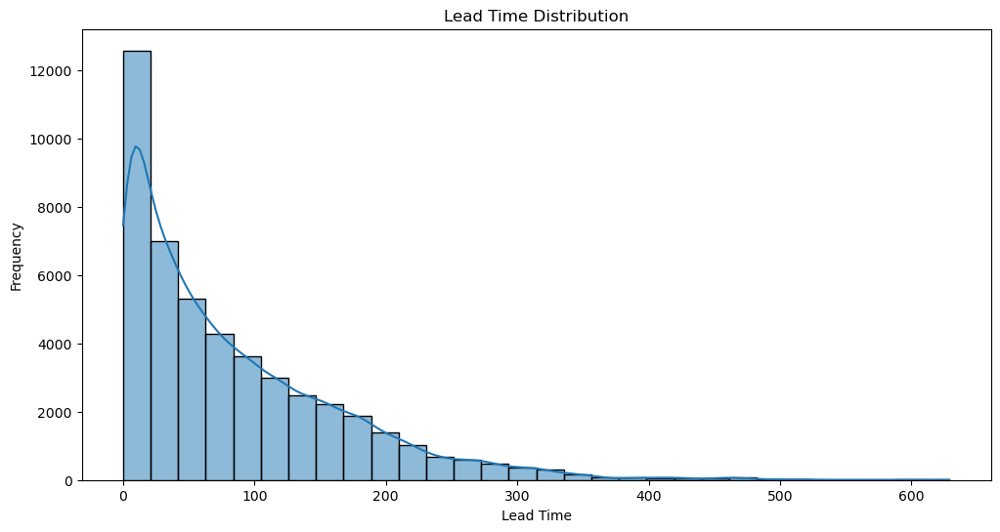

In [13]:
#histogram of lead_time
plt.figure(figsize=(12, 6))
sns.histplot(data=hotel_data_copy3, x='lead_time', bins=30, kde=True)
plt.title('Lead Time Distribution')
plt.xlabel('Lead Time')
plt.ylabel('Frequency')
plt.show()

In [14]:
#use interquartile range to find and remove outliers
Q1 = hotel_data_copy3['lead_time'].quantile(0.25)
Q3 = hotel_data_copy3['lead_time'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

hotel_data_copy3 = hotel_data_copy3[(hotel_data_copy3['lead_time'] >= lower_bound) & (hotel_data_copy3['lead_time'] <= upper_bound)]

In [15]:
#boxplot of adr
px.box(hotel_data_copy3, x = 'arrival_date_year', y = 'adr', color = 'arrival_date_year', points = 'outliers')

C:\Users\carte\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



C:\Users\carte\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



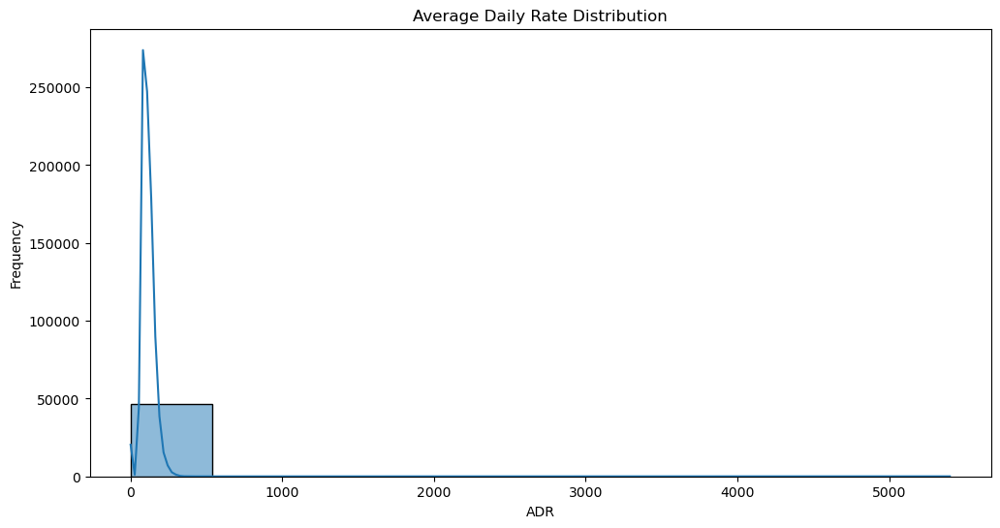

In [16]:
#histogram of adr
plt.figure(figsize=(12, 6))
sns.histplot(data=hotel_data_copy3, x='adr', bins=10, kde=True)
plt.title('Average Daily Rate Distribution')
plt.xlabel('ADR')
plt.ylabel('Frequency')
plt.show()

In [17]:
#remove outliers in adr
hotel_data_copy3 = hotel_data_copy3[hotel_data_copy3['adr'] <= 300]

In [18]:
#boxplot of stays_in_week_nights
px.box(hotel_data_copy3, x = 'arrival_date_year', y = 'stays_in_week_nights', color = 'arrival_date_year', points = 'outliers')

C:\Users\carte\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [19]:
#remove outliers in stays_in_week_nights
hotel_data_copy3 = hotel_data_copy3[hotel_data_copy3['stays_in_week_nights'] <= 10]

In [20]:
#boxplot of days_in_waiting_list
px.box(hotel_data_copy3, x = 'arrival_date_year', y = 'days_in_waiting_list', color = 'arrival_date_year', points = 'outliers')

C:\Users\carte\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [21]:
#remove outliers in days_in_waiting_list
hotel_data_copy3 = hotel_data_copy3[hotel_data_copy3['days_in_waiting_list'] <= 50]

In [22]:
hotel_data_clean = hotel_data_copy3.copy()

hotel_data_clean.shape

(46012, 36)

### Descriptive and Summary Statistics <a class="anchor" id="descriptive"></a>

In [23]:
#descriptive statistics on numerical columns
round(hotel_data_clean.describe(),2)

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,...,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date,total_nights,total_guests,arrival_date,booking_date,days_to_cancel,price
count,46012.00,46012.00,46012.00,46012.00,46012.00,46012.00,46012.00,46012.00,46012.00,46012.00,...,46012.00,46012.00,46012.00,46012,46012.00,46012.00,46012,46012,13684.00,46012.00
mean,0.31,75.37,2016.26,26.54,15.74,0.91,2.32,1.93,0.14,0.01,...,114.00,0.03,0.74,2016-09-17 09:42:14.051986176,3.22,2.07,2016-10-02 15:45:48.117882112,2016-07-19 06:50:45.744588288,58.50,366.51
min,0.00,0.00,2015.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,2014-10-17 00:00:00,0.00,0.00,2015-07-01 00:00:00,2014-10-17 00:00:00,0.00,0.00
25%,0.00,18.00,2016.00,16.00,8.00,0.00,1.00,2.00,0.00,0.00,...,86.63,0.00,0.00,2016-04-12 00:00:00,2.00,2.00,2016-04-28 00:00:00,2016-02-09 00:00:00,12.00,197.60
50%,0.00,55.00,2016.00,27.00,16.00,1.00,2.00,2.00,0.00,0.00,...,108.00,0.00,1.00,2016-09-20 00:00:00,3.00,2.00,2016-10-03 00:00:00,2016-07-30 00:00:00,36.00,318.60
75%,1.00,117.00,2017.00,37.00,23.00,2.00,3.00,2.00,0.00,0.00,...,136.47,0.00,1.00,2017-03-14 00:00:00,4.00,2.00,2017-04-09 00:00:00,2017-01-14 00:00:00,89.00,471.00
max,1.00,286.00,2017.00,53.00,31.00,6.00,10.00,4.00,3.00,10.00,...,300.00,3.00,5.00,2017-09-07 00:00:00,16.00,5.00,2017-08-31 00:00:00,2017-08-30 00:00:00,286.00,3730.02
std,0.46,68.56,0.65,13.44,8.83,0.87,1.44,0.52,0.45,0.10,...,40.55,0.18,0.83,NaN,1.80,0.67,NaN,NaN,59.99,251.11


In [24]:
#descriptive statistics on categorical columns
hotel_data_clean.describe(include='object')

,meal,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,agent,customer_type,reservation_status,country
count,46012,46012,46012,46012,46012,46012,46012,46012,46012,46012
unique,4,7,5,7,8,3,218,4,3,163
top,Bed & Breakfast,Online TA,TA/TO,A,A,No Deposit,9,Transient,Check-Out,Portugal
freq,34578,34103,42160,32118,28530,45603,28124,39220,31726,8928


In [25]:
#function to display summary of categorical columns' unique values
def cat_summary(df, column):
    """
    Function to display the unique values, their counts and percentages of the total column in a dataframe
    """
    summary = df[column].value_counts().reset_index()
    summary.columns = [column, 'Count']
    summary['Percentage'] = round(summary['Count'] / df.shape[0] * 100, 2)
    return summary

#display summary of each categorical column
for column in hotel_data_clean.select_dtypes(include=['object']).columns:
    print(f'\nSummary of {column} column:')
    print(cat_summary(hotel_data_clean, column))
    print('––' * 50)


Summary of meal column:
              meal  Count  Percentage
0  Bed & Breakfast  34578       75.15
1  No Meal Package   8976       19.51
2       Half Board   2455        5.34
3       Full Board      3        0.01
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

Summary of market_segment column:
  market_segment  Count  Percentage
0      Online TA  34103       74.12
1  Offline TA/TO   6623       14.39
2         Direct   3307        7.19
3         Groups   1689        3.67
4      Corporate    217        0.47
5  Complementary     50        0.11
6       Aviation     23        0.05
––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––

Summary of distribution_channel column:
  distribution_channel  Count  Percentage
0                TA/TO  42160       91.63
1               Direct   3349        7.28
2            Corporate    323        0.70
3                  GDS    178        0.39
4        

### Data Visualizations <a class="anchor" id="data_viz"></a>

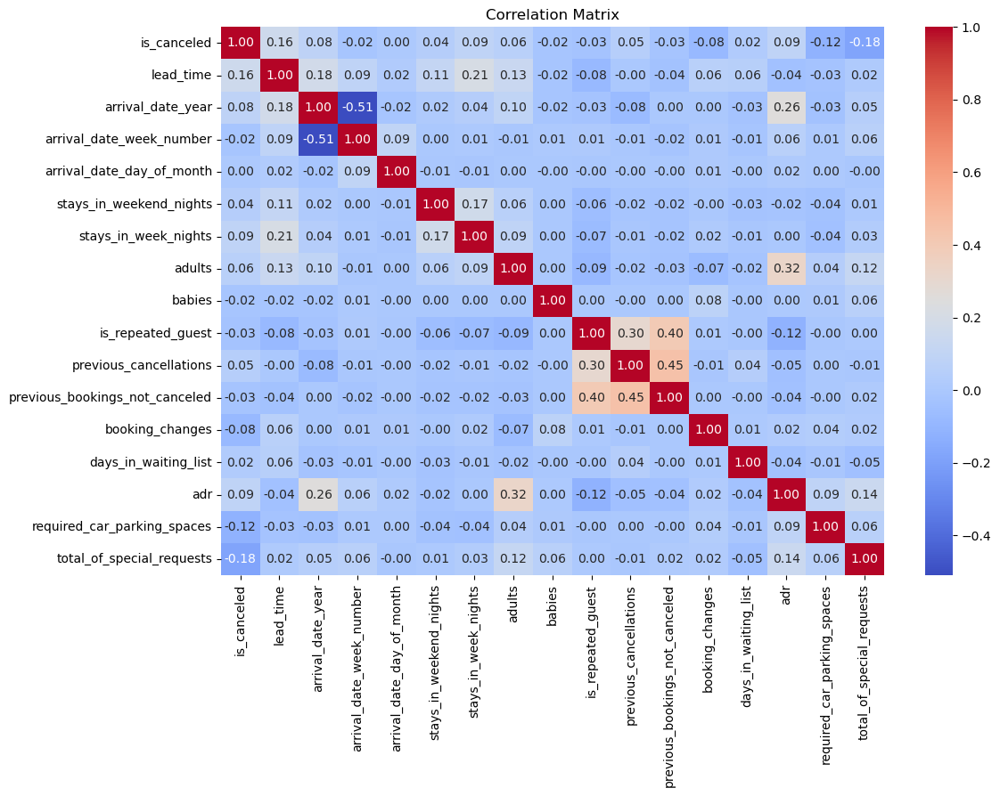

In [26]:
#correlation matrix
numerical_columns = hotel_data_clean.select_dtypes(include=['int64', 'float64']).columns

#drop columns that are not needed
numerical_columns = numerical_columns.drop(['total_guests', 'price', 'total_nights', 'days_to_cancel'])

correlation_matrix = hotel_data_clean[numerical_columns].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

C:\Users\carte\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



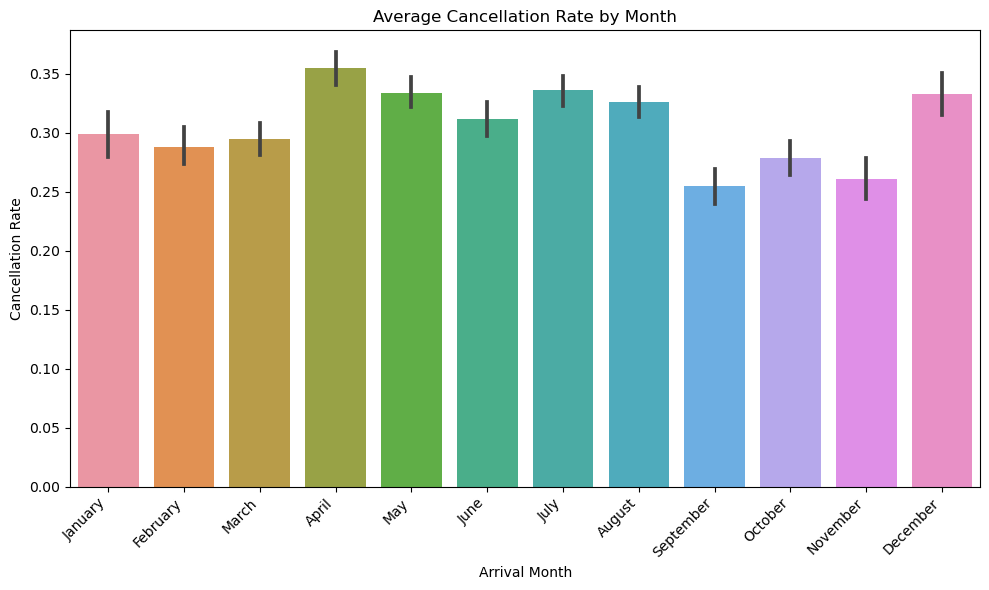

'\nPretty consistent cancellation across months. September-November experiences the lowest rate of cancellations. \nDefinitely some seasonality and fluctuations throughout the year, low cancellations during Sep-Nov and Jan-March and higher \ncancellations during the spring and summer months, and December.\n'

In [27]:
#exploring cancellation rate by month and sort by month
hotel_data_clean['arrival_date_month'] = pd.Categorical(hotel_data_clean['arrival_date_month'],
                                                         categories=['January', 'February', 'March', 'April', 'May',
                                                                     'June', 'July', 'August', 'September', 'October',
                                                                     'November', 'December'], ordered=True)
plt.figure(figsize=(10, 6))
sns.barplot(x='arrival_date_month', y='is_canceled', data=hotel_data_clean)

plt.xticks(rotation=45, ha='right')  # rotate & align labels
plt.xlabel('Arrival Month')
plt.ylabel('Cancellation Rate')
plt.title('Average Cancellation Rate by Month')
plt.tight_layout()
plt.show()

'''
Pretty consistent cancellation across months. September-November experiences the lowest rate of cancellations. 
Definitely some seasonality and fluctuations throughout the year, low cancellations during Sep-Nov and Jan-March and higher 
cancellations during the spring and summer months, and December.
'''

'\nWe see that its much easier for individuals to cancel when they have no deposit with a strong confidence level (short bar).\nWe can also note that when the deposit is non refundable, almost all observations do not cancel, with another strong confidence level indicated by the short error bar.\nHowever, when the deposit is refundable, we see almost 80% of observations tend to cancel, but the error bar indicates that there is a lot of \nvariability across these observations (or fewer data points, will double check)\n'

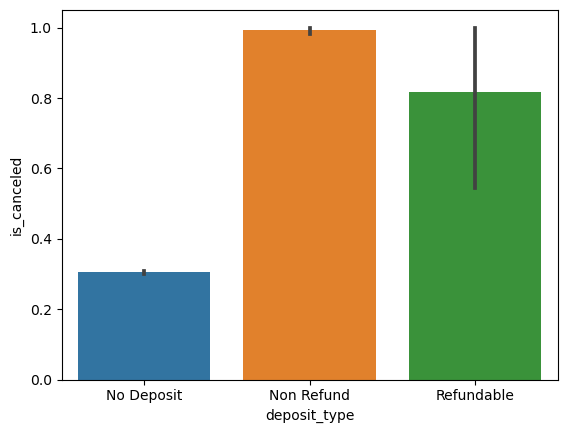

In [28]:
#exploring cancellation rates by deposit type: Do people tend to cancel more/less based on how they pay their initial deposit?
sns.barplot(x='deposit_type', y='is_canceled', data=hotel_data_clean)

'''
We see that its much easier for individuals to cancel when they have no deposit with a strong confidence level (short bar).
We can also note that when the deposit is non refundable, almost all observations do not cancel, with another strong confidence level indicated by the short error bar.
However, when the deposit is refundable, we see almost 80% of observations tend to cancel, but the error bar indicates that there is a lot of 
variability across these observations (or fewer data points, will double check)
'''

In [29]:
#assessing variability within the refundable deposits: does the error bar reflect the lack of data points or is there actual variability between observations?

#geting percentage breakdown of deposit types
hotel_data_clean['deposit_type'].value_counts(normalize=True) * 100

'''
So yes, there are much fewer data ponits for refundable, hence the strong error bar. 
Also great to note that 99% of our observations placed no initial deposit for their bookings.
'''

'\nSo yes, there are much fewer data ponits for refundable, hence the strong error bar. \nAlso great to note that 99% of our observations placed no initial deposit for their bookings.\n'

In [ ]:
#exploring average daily rate by deposit type
plt.figure(figsize=(8, 5))
ax = sns.barplot(x='deposit_type', y='adr', data=hotel_data_clean, ci=None)

#add data labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=3)

#titles and labels
plt.title('Average ADR by Deposit Type')
plt.ylabel('Average Daily Rate (ADR)')
plt.xlabel('Deposit Type')
plt.tight_layout()
plt.show()


'''
We can see that the average daily rate (how much a customer is paying per night) is higher when the deposit is refundable. 
Probably willing to pay more when they know they can get it back? Non refundable deposits though seem to have lower daily rates, 
which can make sense. If people know their deposit is non refundable, they're not willing to pay as much since they may not be able to get it back incase 
of emergencies or a need to cancel.
'''

#checking the adr mean to see where the deposits can fall compared to adr
hotel_data_clean['adr'].mean() 

'\nCompared to all observations, not a lot of booking changes.\n'

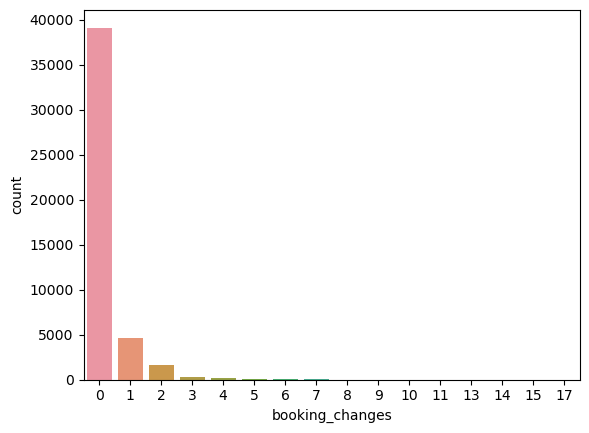

In [31]:
#exploring room type changes 
sns.countplot(x='booking_changes', data=hotel_data_clean)

'''
Compared to all observations, not a lot of booking changes.
'''

C:\Users\carte\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



"\nNormal distribution of number of guests, we see that it's more common that there are 2 guests for the bookings. \nWe could say there are a lot of couples who book at these hotels!\n"

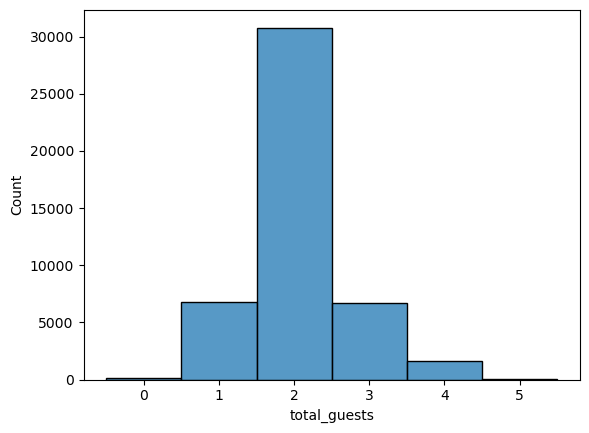

In [32]:
#distribution of number of guests
sns.histplot(hotel_data_clean['total_guests'], discrete=True)

'''
Normal distribution of number of guests, we see that it's more common that there are 2 guests for the bookings. 
We could say there are a lot of couples who book at these hotels!
'''

C:\Users\carte\AppData\Local\Temp\ipykernel_21340\911460057.py:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




'\nWe see customer types that commonly have more people in their bookings bring in the lower daily rates, whereas solo travelers or\ncontract bookings have a higher average daily rate. This can make sense if hotels offer discounts or booking rates for larger parties.\n'

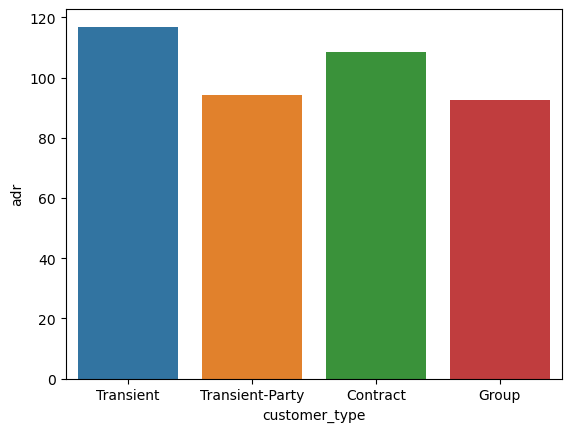

In [33]:
#exploring average daily rate by customer type: Do certain type of customers provide more revenue for the hotels?
sns.barplot(x='customer_type', y='adr', data=hotel_data_clean, ci=None)

'''
We see customer types that commonly have more people in their bookings bring in the lower daily rates, whereas solo travelers or
contract bookings have a higher average daily rate. This can make sense if hotels offer discounts or booking rates for larger parties.
'''

'\nInteresting! We see that Portugal and France individuals book with these hotels the most. Then a bunch of European countries follow, \nwe can definitely see that these hotels are probably based in Europe!\n'

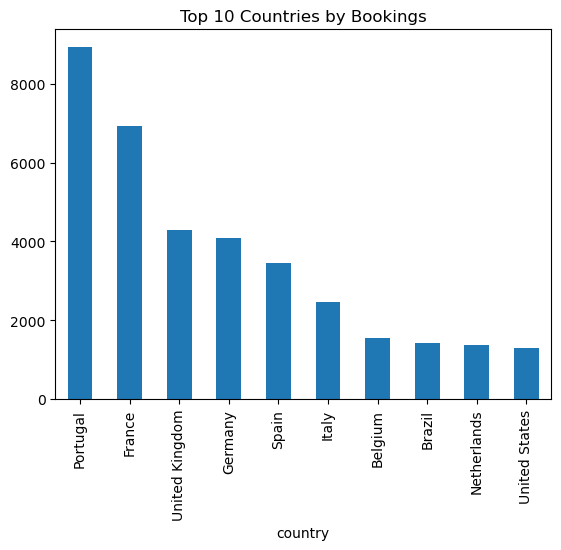

In [34]:
#exploring the top 10 countires by the number of bookings: Curious, what countries book with these hotels the most?
hotel_data_clean['country'].value_counts().head(10).plot(kind='bar', title='Top 10 Countries by Bookings')

'''
Interesting! We see that Portugal and France individuals book with these hotels the most. Then a bunch of European countries follow, 
we can definitely see that these hotels are probably based in Europe!
'''

### Final Data Manipulations <a class="anchor" id="final_data_clean"></a>

#### Dealing with Categorical Outliers

In [35]:
#filter out Full Board
hotel_data_clean = hotel_data_clean[hotel_data_clean['meal'] != 'Full Board']

#filter out market segment
hotel_data_clean = hotel_data_clean[~hotel_data_clean['market_segment'].isin(['Aviation'])]

#rename Complementary and Corporate to 'Other' in market segment
hotel_data_clean['market_segment'].replace({'Complementary': 'Other', 'Corporate': 'Other'}, inplace=True)

#filter out distribution channel
hotel_data_clean = hotel_data_clean[~hotel_data_clean['distribution_channel'].isin(['Undefined'])]

#rename Corporate and GDS to 'Other' in distribution channel
hotel_data_clean['distribution_channel'].replace({'Corporate': 'Other', 'GDS': 'Other'}, inplace=True)

#filter out reserved_room_type
hotel_data_clean = hotel_data_clean[~hotel_data_clean['distribution_channel'].isin(['G', 'C'])]

#filter out assigned_room_type
hotel_data_clean = hotel_data_clean[~hotel_data_clean['assigned_room_type'].isin(['K', 'C'])]

#make whole deposit_type column 'No Deposit'
hotel_data_clean['deposit_type'] = 'No Deposit'
hotel_data_clean.drop('deposit_type', axis=1, inplace=True)

#filter out customer_type with 'Group
hotel_data_clean = hotel_data_clean[hotel_data_clean['customer_type'] != 'Group']

#filter out reservation_status with 'No-Show'
hotel_data_clean = hotel_data_clean[hotel_data_clean['reservation_status'] != 'No-Show']

#filter out listings with agents that appears less than 10 times
agent_counts = hotel_data_clean['agent'].value_counts()
agents_to_remove = agent_counts[agent_counts < 10].index
hotel_data_clean = hotel_data_clean[~hotel_data_clean['agent'].isin(agents_to_remove)]

#filter out countries that appear less than 10 times
country_counts = hotel_data_clean['country'].value_counts()
countries_to_remove = country_counts[country_counts < 6].index
hotel_data_clean = hotel_data_clean[~hotel_data_clean['country'].isin(countries_to_remove)]

C:\Users\carte\AppData\Local\Temp\ipykernel_21340\2405227788.py:8: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\carte\AppData\Local\Temp\ipykernel_21340\2405227788.py:14: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace

#### Encoding

In [36]:
hotel_data_clean2 = hotel_data_clean.copy()

#convert arrival_date_month to numeric
month_dict = {'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6,
              'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12}
hotel_data_clean2['arrival_date_month'] = hotel_data_clean2['arrival_date_month'].replace(month_dict)

#one-hot encode categorical columns
cat_columns = ['meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type',
               'assigned_room_type', 'customer_type', 'agent']

hotel_data_clean2 = pd.get_dummies(hotel_data_clean2, columns=cat_columns, drop_first=True)

C:\Users\carte\AppData\Local\Temp\ipykernel_21340\3465309290.py:6: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

C:\Users\carte\AppData\Local\Temp\ipykernel_21340\3465309290.py:6: FutureWarning:

The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.



#### Standardization

In [37]:
hotel_data_clean3 = hotel_data_clean2.copy()

#scale numerical columns
scaler = StandardScaler()

columns_to_scale = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'total_nights', 'adr', 'days_in_waiting_list',
                    'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes']

hotel_data_clean3[columns_to_scale] = scaler.fit_transform(hotel_data_clean3[columns_to_scale])

#### Date Column Adjustments

In [38]:
#make date columns type datetime
hotel_data_clean3['arrival_date'] = pd.to_datetime(hotel_data_clean3['arrival_date'])
hotel_data_clean3['booking_date'] = pd.to_datetime(hotel_data_clean3['booking_date'])
hotel_data_clean3['reservation_status_date'] = pd.to_datetime(hotel_data_clean3['reservation_status_date'])

#drop the 'reservation_status' and 'days_to_cancel' columns
hotel_data_clean3.drop(['reservation_status', 'days_to_cancel'], axis=1, inplace=True)

#create new features from date columns
hotel_data_clean3['booking_month'] = hotel_data_clean3['booking_date'].dt.month
hotel_data_clean3['booking_dayofweek'] = hotel_data_clean3['booking_date'].dt.dayofweek

hotel_data_clean3['reservation_month'] = hotel_data_clean3['reservation_status_date'].dt.month
hotel_data_clean3['reservation_dayofweek'] = hotel_data_clean3['reservation_status_date'].dt.dayofweek

#drop original date columns
hotel_data_clean3.drop(['arrival_date', 'booking_date', 'reservation_status_date'], axis=1, inplace=True)

#convert date-based features to categorical
hotel_data_clean3['booking_month'] = hotel_data_clean3['booking_month'].astype('category')
hotel_data_clean3['booking_dayofweek'] = hotel_data_clean3['booking_dayofweek'].astype('category')
hotel_data_clean3['reservation_month'] = hotel_data_clean3['reservation_month'].astype('category')
hotel_data_clean3['reservation_dayofweek'] = hotel_data_clean3['reservation_dayofweek'].astype('category')

# One-hot encode categorical date features
hotel_data_clean3 = pd.get_dummies(hotel_data_clean3, columns=[
    'booking_month', 'booking_dayofweek',
    'reservation_month', 'reservation_dayofweek'
], drop_first=True)

In [39]:
final_data = hotel_data_clean3.copy()

#dimensions of final data
print('Final data dimensions:', final_data.shape)

#save final data to csv
final_data.to_csv('hotel_bookings_cleaned.csv', index=False)

Final data dimensions: (44337, 262)


### Logistic Regression <a class="anchor" id="logit"></a>

In [40]:
#load final data
logit_data = pd.read_csv('hotel_bookings_cleaned.csv')

#running on a sample of like 10% for debugging
#logit_data = logit_data.sample(frac=0.1, random_state=42)

In [41]:
X = logit_data.drop(['is_canceled'], axis=1)
y = logit_data['is_canceled']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#display all column names of the DataFrame
list(X.columns)

['lead_time',
 'arrival_date_year',
 'arrival_date_month',
 'arrival_date_week_number',
 'arrival_date_day_of_month',
 'stays_in_weekend_nights',
 'stays_in_week_nights',
 'adults',
 'children',
 'babies',
 'is_repeated_guest',
 'previous_cancellations',
 'previous_bookings_not_canceled',
 'booking_changes',
 'days_in_waiting_list',
 'adr',
 'required_car_parking_spaces',
 'total_of_special_requests',
 'total_nights',
 'total_guests',
 'price',
 'meal_Half Board',
 'meal_No Meal Package',
 'country_Algeria',
 'country_Angola',
 'country_Argentina',
 'country_Armenia',
 'country_Australia',
 'country_Austria',
 'country_Azerbaijan',
 'country_Bangladesh',
 'country_Belarus',
 'country_Belgium',
 'country_Bosnia and Herzegovina',
 'country_Brazil',
 'country_Bulgaria',
 'country_Cabo Verde',
 'country_Cameroon',
 'country_Chile',
 'country_China',
 'country_Colombia',
 'country_Costa Rica',
 'country_Croatia',
 'country_Cyprus',
 'country_Czechia',
 'country_Denmark',
 'country_Ecuador',

In [42]:
#this will actually take 5ever to run with the full dataset, just use a sample or just skip to the next step

#step 1: remove multicollinearity
X_train_numeric = X_train.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0)

#calculate VIF for each feature
vif_data = pd.DataFrame({
    "feature": X_train_numeric.columns,
    "VIF": [variance_inflation_factor(X_train_numeric.values, i) for i in range(X_train_numeric.shape[1])]
})

#remove features with VIF > 10
high_vif_features = vif_data[vif_data["VIF"] > 10]["feature"].tolist()

C:\Users\carte\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning:

divide by zero encountered in scalar divide



In [43]:
#display features with high VIF
print("Features with high VIF (> 10):")
high_vif_features

Features with high VIF (> 10):


['arrival_date_year',
 'arrival_date_month',
 'arrival_date_week_number',
 'arrival_date_day_of_month',
 'stays_in_weekend_nights',
 'stays_in_week_nights',
 'adults',
 'children',
 'total_nights',
 'total_guests',
 'price']

In [44]:
#remove features with high VIF from the training set
X_model = X_train.drop(columns= high_vif_features, errors='ignore')

#replace inf and NaN values with 0
X_model = X_model.replace([np.inf, -np.inf], np.nan).fillna(0)

In [45]:
#remove suspicious variables
suspicious_vars = set()
X_model_numeric = X_model.select_dtypes(include=[np.number])

In [46]:
#near-zero variance
selector = VarianceThreshold(threshold=1e-4)
selector.fit(X_model_numeric)
suspicious_vars.update(X_model_numeric.columns[~selector.get_support()])

In [47]:
#check for perfect separation or numerical instability
for col in X_model.columns:
    try:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            model = sm.Logit(y_train, sm.add_constant(X_model[[col]])).fit(disp=False)
            params = model.params
            if not model.mle_retvals['converged'] or np.any(np.abs(params) > 10):
                suspicious_vars.add(col)
    except Exception:
        suspicious_vars.add(col)

In [48]:
#highly skewed or low-frequency variables
skewed = X_model_numeric.skew(numeric_only=True).abs()
suspicious_vars.update(skewed[skewed > 10].index.tolist())
suspicious_vars.update([col for col in X_model_numeric.columns if X_model_numeric[col].sum() < 30])

In [49]:
#final cleanup
X_clean = X_model_numeric.drop(columns=suspicious_vars, errors='ignore').apply(pd.to_numeric, errors='coerce').fillna(0)
X_clean = sm.add_constant(X_clean)

In [50]:
#track original feature set
original_features = set(X_train.columns)

#after all filters
remaining_features = set(X_clean.columns) - {"const"}

#track removed features and categorize
dropped = original_features - remaining_features
dropped_due_to_vif = set(high_vif_features)
dropped_due_to_suspicious = suspicious_vars

print(f"✅ Remaining features ({len(remaining_features)}):")
print(sorted(remaining_features))

print(f"\n❌ Dropped due to high VIF ({len(dropped & dropped_due_to_vif)}):")
print(sorted(dropped & dropped_due_to_vif))

print(f"\n❌ Dropped due to suspicious screening ({len(dropped & dropped_due_to_suspicious)}):")
print(sorted(dropped & dropped_due_to_suspicious))

✅ Remaining features (1):
['total_of_special_requests']

❌ Dropped due to high VIF (11):
['adults', 'arrival_date_day_of_month', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_year', 'children', 'price', 'stays_in_week_nights', 'stays_in_weekend_nights', 'total_guests', 'total_nights']

❌ Dropped due to suspicious screening (249):
['adr', 'agent_10', 'agent_103', 'agent_104', 'agent_11', 'agent_111', 'agent_118', 'agent_119', 'agent_12', 'agent_121', 'agent_13', 'agent_132', 'agent_134', 'agent_138', 'agent_14', 'agent_15', 'agent_152', 'agent_154', 'agent_155', 'agent_157', 'agent_159', 'agent_16', 'agent_168', 'agent_17', 'agent_170', 'agent_171', 'agent_173', 'agent_174', 'agent_187', 'agent_19', 'agent_191', 'agent_195', 'agent_2', 'agent_20', 'agent_205', 'agent_21', 'agent_22', 'agent_220', 'agent_229', 'agent_23', 'agent_234', 'agent_24', 'agent_254', 'agent_26', 'agent_262', 'agent_27', 'agent_28', 'agent_281', 'agent_29', 'agent_290', 'agent_296', 'agent_3', '

In [51]:
#initial logistic regression
logit_model = sm.Logit(y_train, X_clean).fit(maxiter=500, disp=True)
print(logit_model.summary())

Optimization terminated successfully.
         Current function value: 0.597253
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:            is_canceled   No. Observations:                31035
Model:                          Logit   Df Residuals:                    31033
Method:                           MLE   Df Model:                            1
Date:                Wed, 30 Apr 2025   Pseudo R-squ.:                 0.02852
Time:                        20:09:29   Log-Likelihood:                -18536.
converged:                       True   LL-Null:                       -19080.
Covariance Type:            nonrobust   LLR p-value:                1.222e-238
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.4663      0.016    -28.839      0.000      -0.

In [52]:
y_prob = logit_model.predict(X_clean)
y_pred = (y_prob >= 0.5).astype(int)
print(confusion_matrix(y_train, y_pred))
print(classification_report(y_train, y_pred))
print("ROC AUC:", roc_auc_score(y_train, y_prob))

[[21579     0]
 [ 9456     0]]
              precision    recall  f1-score   support

           0       0.70      1.00      0.82     21579
           1       0.00      0.00      0.00      9456

    accuracy                           0.70     31035
   macro avg       0.35      0.50      0.41     31035
weighted avg       0.48      0.70      0.57     31035

ROC AUC: 0.612230147396859


C:\Users\carte\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\carte\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\carte\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [53]:
#step 2: Feature Selection
market_segment_cols = [
    'market_segment_Offline TA/TO',
    'market_segment_Groups',
    'market_segment_Other',
    'market_segment_Online TA' 
]

important_features = [
    'lead_time', 'booking_changes', 'is_repeated_guest',
    # 'previous_cancellations' ---- removing this because its to similar to previous_bookings_not_canceled
    'previous_bookings_not_canceled',
    'days_in_waiting_list', 'total_guests', 'total_nights'
] + market_segment_cols

In [54]:
X_clean = X_model.select_dtypes(include=[np.number])
X_clean = X_clean.apply(pd.to_numeric, errors='coerce').fillna(0)
X_clean = sm.add_constant(X_clean)

In [55]:
X_model = X_train[important_features].copy()
#X_model = X_model.replace([np.inf, -np.inf], np.nan).fillna(0)

#convert all bool columns to int
X_model = X_model.apply(lambda col: col.astype(int) if col.dtype == 'bool' else col)

#final cleanup before modeling
#ensure all columns in X_model are numeric
X_clean = X_model.select_dtypes(include=[np.number])

#convert to numeric, handle missing values, and add a constant
X_clean = X_clean.apply(pd.to_numeric, errors='coerce').fillna(0)
X_clean = sm.add_constant(X_clean)

#fit logistic regression model again
logit_model = sm.Logit(y_train, X_clean).fit(maxiter=500, disp=True)
print(logit_model.summary())

Optimization terminated successfully.
         Current function value: 0.576444
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:            is_canceled   No. Observations:                31035
Model:                          Logit   Df Residuals:                    31023
Method:                           MLE   Df Model:                           11
Date:                Wed, 30 Apr 2025   Pseudo R-squ.:                 0.06236
Time:                        20:09:29   Log-Likelihood:                -17890.
converged:                       True   LL-Null:                       -19080.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -1.8722      0.074    -25.422     

In [56]:
#evaluate model
y_prob = logit_model.predict(X_clean)
y_pred = (y_prob >= 0.5).astype(int)
print(confusion_matrix(y_train, y_pred))
print(classification_report(y_train, y_pred))
print("ROC AUC:", roc_auc_score(y_train, y_prob))

[[20578  1001]
 [ 8351  1105]]
              precision    recall  f1-score   support

           0       0.71      0.95      0.81     21579
           1       0.52      0.12      0.19      9456

    accuracy                           0.70     31035
   macro avg       0.62      0.54      0.50     31035
weighted avg       0.65      0.70      0.62     31035

ROC AUC: 0.6729630673159475


^^ that was our the model we used to find which variables are important and statistically significant so now everything after if using things like SMOTE to make our predictions better

💡 Keep statsmodels for insight + interpretation
💡 Add scikit-learn for tuning, validation, and performance

In [57]:
#use same features and data
final_features = [
    'lead_time','booking_changes', 'is_repeated_guest', 'previous_bookings_not_canceled', 
    'days_in_waiting_list', 'total_guests', 'total_nights' , 'market_segment_Offline TA/TO', 
'market_segment_Groups', 'market_segment_Other', 'market_segment_Online TA']

X_train_clean = X_train[final_features].copy().fillna(0)
X_test_clean = X_test[final_features].copy().fillna(0)

#fit scikit-learn logistic regression
model = LogisticRegression(max_iter=1000)
model.fit(X_train_clean, y_train)

#predict
y_pred = model.predict(X_test_clean)
y_prob = model.predict_proba(X_test_clean)[:, 1]

#evaluate
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))

[[8840  421]
 [3590  451]]
              precision    recall  f1-score   support

           0       0.71      0.95      0.82      9261
           1       0.52      0.11      0.18      4041

    accuracy                           0.70     13302
   macro avg       0.61      0.53      0.50     13302
weighted avg       0.65      0.70      0.62     13302

ROC AUC: 0.6788428407976005


In [58]:
#re-train with balanced class weights
model_balanced = LogisticRegression(max_iter=1000, class_weight='balanced')
model_balanced.fit(X_train_clean, y_train)

#predict
y_pred_bal = model_balanced.predict(X_test_clean)
y_prob_bal = model_balanced.predict_proba(X_test_clean)[:, 1]

#evaluate
print(confusion_matrix(y_test, y_pred_bal))
print(classification_report(y_test, y_pred_bal))
print("ROC AUC:", roc_auc_score(y_test, y_prob_bal))

[[5522 3739]
 [1321 2720]]
              precision    recall  f1-score   support

           0       0.81      0.60      0.69      9261
           1       0.42      0.67      0.52      4041

    accuracy                           0.62     13302
   macro avg       0.61      0.63      0.60     13302
weighted avg       0.69      0.62      0.63     13302

ROC AUC: 0.6788011426234941


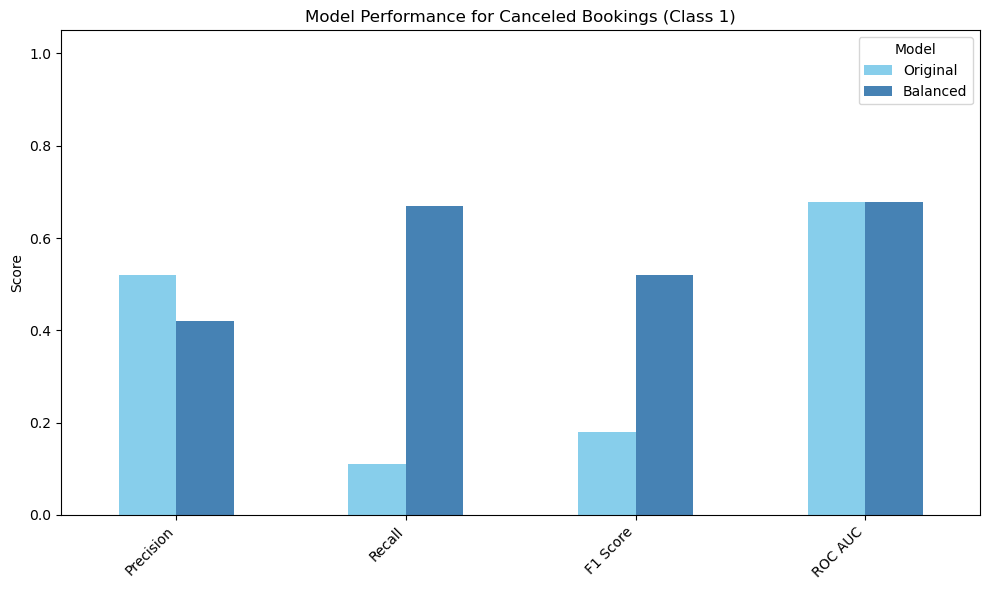

In [59]:
#LC insight visual: Highlights model performance between the unbalanced and balanced datasets

#just class 1 (cancellations) + overall metrics
metrics = {
    'Precision': [0.52, 0.42],
    'Recall': [0.11, 0.67],
    'F1 Score': [0.18, 0.52],
    'ROC AUC': [0.67884, 0.67880]
}

metrics_df = pd.DataFrame(metrics, index=['Original', 'Balanced']).T

#plo
metrics_df.plot(kind='bar', figsize=(10, 6), color=['skyblue', 'steelblue'])
plt.title("Model Performance for Canceled Bookings (Class 1)")
plt.ylabel("Score")
plt.ylim(0, 1.05)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Model')
plt.tight_layout()
plt.show()

#we want HIGH RECALL for class 1 (canceled) because missing a cancellation (false negative) can leave us with empty rooms and lost revenue.

In [60]:
#coefficients and odds ratios
coefs = model.coef_[0]
odds = np.exp(coefs)

coef_summary = pd.DataFrame({
    'Feature': X_train_clean.columns,
    'Coefficient': coefs,
    'Odds Ratio': odds,
    'Interpretation': ['↑ Likely to cancel' if o > 1 else '↓ Less likely to cancel' for o in odds]
}).sort_values(by='Odds Ratio', ascending=False)

pd.set_option('display.max_rows', None)
print(coef_summary)

                           Feature  Coefficient  Odds Ratio  \
10        market_segment_Online TA     0.950541    2.587109   
2                is_repeated_guest     0.946969    2.577884   
8            market_segment_Groups     0.660389    1.935544   
0                        lead_time     0.333803    1.396268   
5                     total_guests     0.112163    1.118695   
6                     total_nights     0.110554    1.116897   
4             days_in_waiting_list     0.077186    1.080243   
9             market_segment_Other    -0.143771    0.866086   
1                  booking_changes    -0.246467    0.781557   
7     market_segment_Offline TA/TO    -0.281170    0.754900   
3   previous_bookings_not_canceled    -0.592903    0.552721   

             Interpretation  
10       ↑ Likely to cancel  
2        ↑ Likely to cancel  
8        ↑ Likely to cancel  
0        ↑ Likely to cancel  
5        ↑ Likely to cancel  
6        ↑ Likely to cancel  
4        ↑ Likely to cancel  
9  

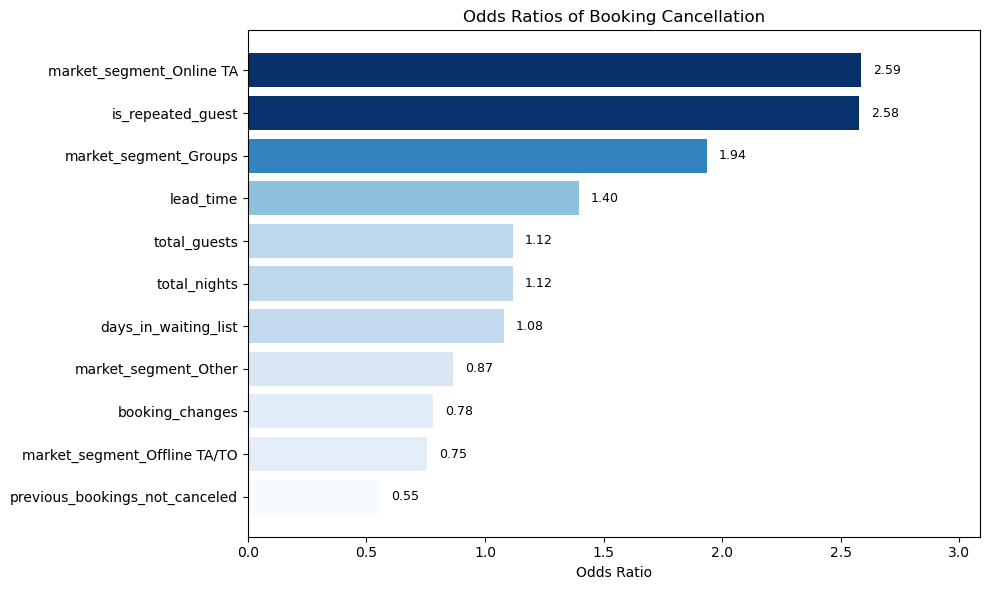

In [61]:
#LC insight visual: Highlights the most impactful variables towards cancellations

#sort by Odds Ratio (ascending for barh)
sorted_df = coef_summary.sort_values("Odds Ratio", ascending=True).reset_index(drop=True)

#normalize for colormap
norm = mcolors.Normalize(vmin=sorted_df["Odds Ratio"].min(), vmax=sorted_df["Odds Ratio"].max())
colors = cm.Blues(norm(sorted_df["Odds Ratio"].values))

#plot
plt.figure(figsize=(10, 6))  # Wider figure
bars = plt.barh(sorted_df['Feature'], sorted_df['Odds Ratio'], color=colors)

#add data labels
for bar, value in zip(bars, sorted_df["Odds Ratio"]):
    plt.text(bar.get_width() + 0.05,                     # more spacing
             bar.get_y() + bar.get_height() / 2,
             f'{value:.2f}',
             va='center', fontsize=9)

#optional: add space on x-axis so labels don’t get cut off
plt.xlim(0, sorted_df["Odds Ratio"].max() + 0.5)

plt.title("Odds Ratios of Booking Cancellation")
plt.xlabel("Odds Ratio")
plt.tight_layout()
plt.show()

In [62]:
#testing the model on the test set
y_prob = logit_model.predict(X_clean)
y_pred = (y_prob >= 0.5).astype(int)

print(confusion_matrix(y_train, y_pred))
print(classification_report(y_train, y_pred))
print("ROC AUC:", roc_auc_score(y_train, y_prob))

[[20578  1001]
 [ 8351  1105]]
              precision    recall  f1-score   support

           0       0.71      0.95      0.81     21579
           1       0.52      0.12      0.19      9456

    accuracy                           0.70     31035
   macro avg       0.62      0.54      0.50     31035
weighted avg       0.65      0.70      0.62     31035

ROC AUC: 0.6729630673159475


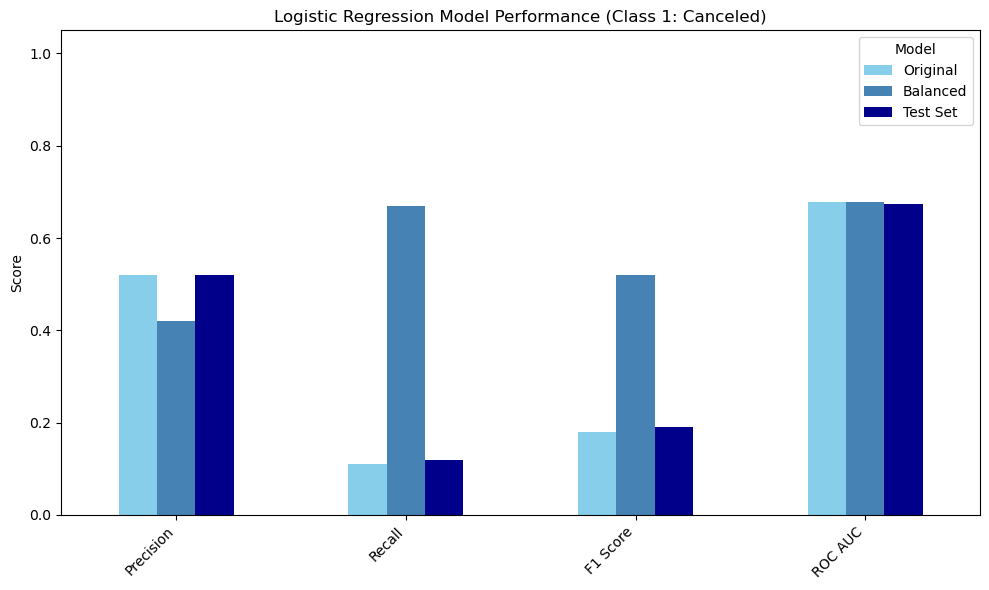

In [63]:
#LC insight visual: Compares model performances including the test set model (not super necessary, just a visual to talk too instead of using just numbers in the presentation)

#all metrics for class 1 (Canceled)
metrics = {
    'Precision': [0.52, 0.42, 0.52],
    'Recall': [0.11, 0.67, 0.12],
    'F1 Score': [0.18, 0.52, 0.19],
    'ROC AUC': [0.67884, 0.67880, 0.67296]
}


#create DataFrame
metrics_df = pd.DataFrame(metrics, index=['Original', 'Balanced', 'Test Set']).T

#plot
metrics_df.plot(kind='bar', figsize=(10, 6), color=['skyblue', 'steelblue', 'darkblue'])
plt.title("Logistic Regression Model Performance (Class 1: Canceled)")
plt.ylabel("Score")
plt.ylim(0, 1.05)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Model')
plt.tight_layout()
plt.show()

In [64]:
#view results and p-values
results_df = pd.DataFrame({
    'Variable': logit_model.params.index,
    'Coefficient': logit_model.params.values,
    'P-Value': logit_model.pvalues.values
})
results_df = results_df.round(4)
results_df

,Variable,Coefficient,P-Value
0,const,-1.8722,0.0000
1,lead_time,0.3339,0.0000
2,booking_changes,-0.2465,0.0000
3,is_repeated_guest,0.9979,0.0000
4,previous_bookings_not_canceled,-0.6180,0.0000
5,days_in_waiting_list,0.0772,0.0000
6,total_guests,0.1126,0.0000
7,total_nights,0.1107,0.0000
8,market_segment_Offline TA/TO,-0.2778,0.0002
9,market_segment_Groups,0.6684,0.0000


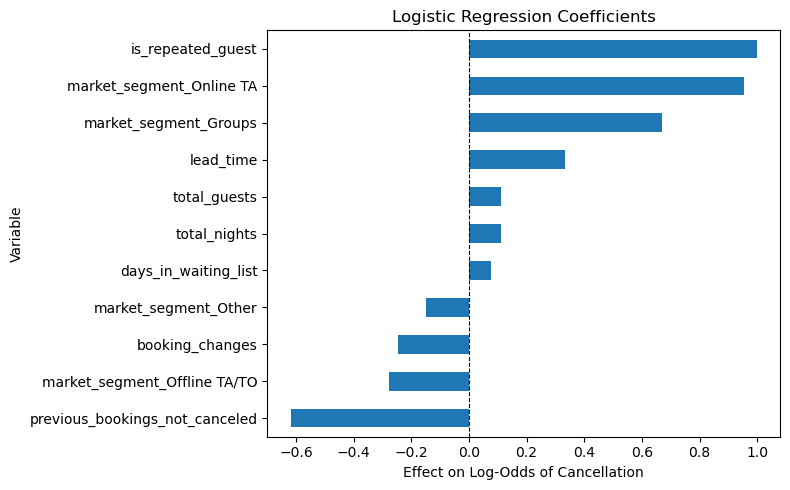

In [65]:
#plotting the coefficients
results_df[1:].sort_values('Coefficient').plot(
    x='Variable', y='Coefficient', kind='barh', figsize=(8,5), legend=False)
plt.title("Logistic Regression Coefficients")
plt.axvline(0, color='black', linewidth=0.8, linestyle='--')
plt.xlabel("Effect on Log-Odds of Cancellation")
plt.tight_layout()
plt.show()

### Cluster Analysis <a class="anchor" id="cluster"></a>

#### Version 1: All Data

##### Preprocessing

In [66]:
#load final data
cluster_data = pd.read_csv('hotel_bookings_cleaned.csv')

#get rid of columns that have 'agent' in title
cluster_data = cluster_data.loc[:, ~cluster_data.columns.str.contains('agent')]

#drop columns that say 'country'
cluster_data = cluster_data.loc[:, ~cluster_data.columns.str.contains('country')]

#drop columns that say 'reservation_month'
cluster_data = cluster_data.loc[:, ~cluster_data.columns.str.contains('reservation_month')]

#drop columns that say 'reservation_dayofweek'
cluster_data = cluster_data.loc[:, ~cluster_data.columns.str.contains('reservation_dayofweek')]

#drop columns that say 'assigned_room_type'
cluster_data = cluster_data.loc[:, ~cluster_data.columns.str.contains('assigned_room_type')]

cluster_data.shape

(44337, 55)

In [67]:
#drop columns that are not needed
cluster_data = cluster_data.drop(['total_guests', 'total_nights', 'price', 'arrival_date_year', 
                                  'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month'], axis=1)

#drop duplicates
cluster_data.drop_duplicates(inplace=True)

#reset index
cluster_data.reset_index(drop=True, inplace=True)

In [68]:
#list correlation coefficients that are 0.7 and above
correlation_matrix = cluster_data.corr()
correlation_matrix = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
correlation_matrix = correlation_matrix.unstack().reset_index()
correlation_matrix.columns = ['Feature 1', 'Feature 2', 'Correlation']
correlation_matrix = correlation_matrix.dropna()
correlation_matrix['Correlation'] = correlation_matrix['Correlation'].abs()
correlation_matrix = correlation_matrix.sort_values(by='Correlation', ascending=False)
correlation_matrix = correlation_matrix[correlation_matrix['Correlation'] >= 0.7]
correlation_matrix

,Feature 1,Feature 2,Correlation
1469,customer_type_Transient-Party,customer_type_Transient,0.844756


In [69]:
#drop columns with high correlation
cluster_data = cluster_data.drop(['customer_type_Transient-Party'], axis=1)

In [70]:
#standardize columns: # adults, # children, # babies
cluster_data[['adults', 'children', 'babies', 'total_of_special_requests', 'required_car_parking_spaces']] = StandardScaler().fit_transform(cluster_data[['adults', 'children', 'babies', 
                                                                                                                                                          'total_of_special_requests', 'required_car_parking_spaces']])

In [71]:
#count of babies, market_segment_Other and distribution_channel_Other
value_columns = ['babies', 'market_segment_Other', 'distribution_channel_Other']

for col in value_columns:
    print(f"Count of {col}:")
    print(cluster_data[col].value_counts())
    print()

#drop babies, market_segment_Other and distribution_channel_Other
cluster_data = cluster_data.drop(['babies', 'market_segment_Other', 'distribution_channel_Other'], axis=1)

Count of babies:
babies
-0.067878     42418
 9.435445       278
 18.938768        4
 94.965351        1
 85.462028        1
Name: count, dtype: int64

Count of market_segment_Other:
market_segment_Other
False    42561
True       141
Name: count, dtype: int64

Count of distribution_channel_Other:
distribution_channel_Other
False    42410
True       292
Name: count, dtype: int64



In [72]:
print(cluster_data.shape)

#export cluster data to csv
cluster_data.to_csv('hotel_bookings_cluster.csv', index=False)

(42702, 44)


##### Hierarchical Clustering

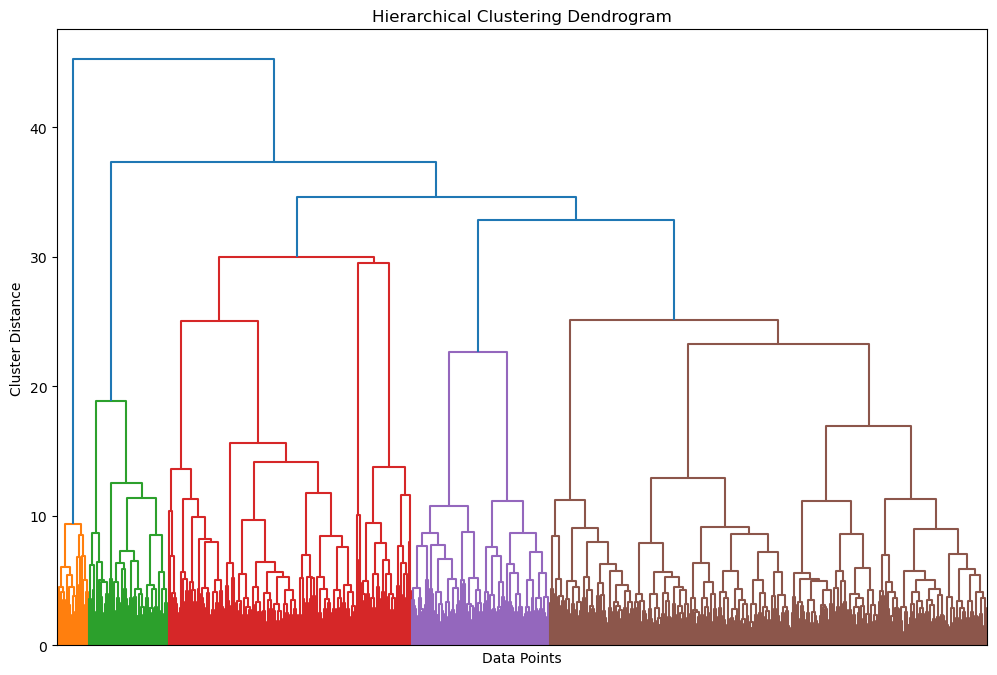

In [73]:
#import cluster data
final_cluster_data = pd.read_csv('hotel_bookings_cluster.csv')

#remove is_canceled column
final_cluster_data = final_cluster_data.drop(['is_canceled'], axis=1)

#sample data for dendrogram
cluster_data_sample = final_cluster_data.sample(n=1000, random_state = 42)

#perform hierarchical clustering using adr as the only feature
Z = linkage(cluster_data_sample, method='ward', metric='euclidean')

#plot dendrogram
plt.figure(figsize=(12, 8))
dendrogram(Z, leaf_rotation=90, leaf_font_size=10)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Cluster Distance')
plt.xticks(visible = False)
plt.show()

In [74]:
#set number of clusters you want
n_clusters = 4

#cut the dendrogram to get cluster labels
cluster_labels = fcluster(Z, n_clusters, criterion='maxclust')

#add to your original sample dataframe
cluster_data_sample['hierarchical_cluster'] = cluster_labels

#count how many samples are in each cluster
cluster_counts = cluster_data_sample['hierarchical_cluster'].value_counts().sort_index()

#print the results
print(cluster_counts)

hierarchical_cluster
1     34
2     86
3    261
4    619
Name: count, dtype: int64


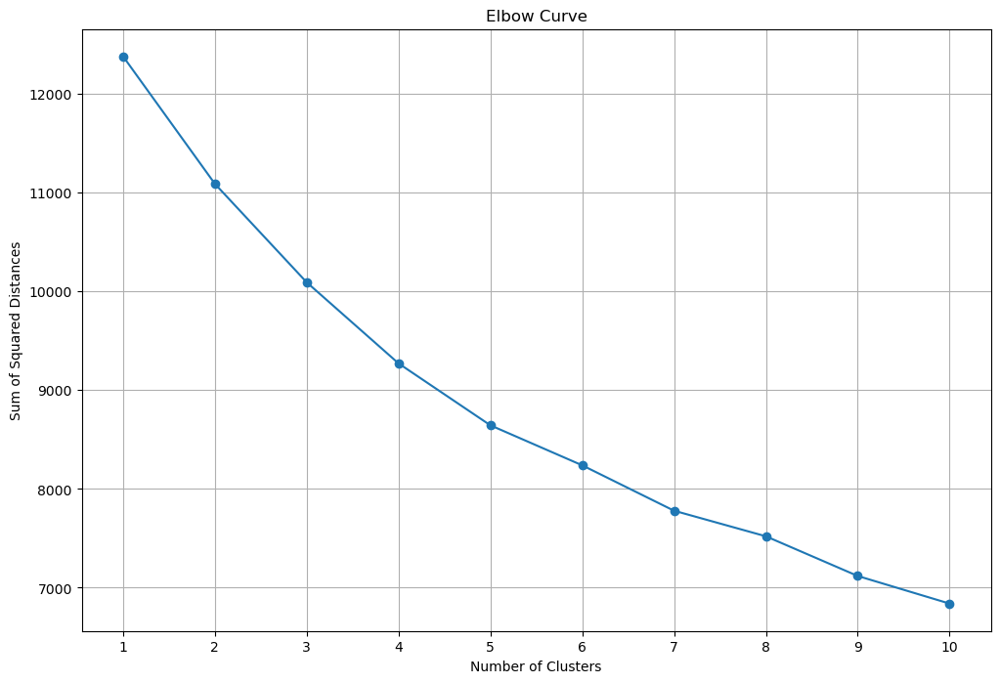

In [75]:
#plot elbow curve
plt.figure(figsize=(12, 8))
plt.title('Elbow Curve')
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(cluster_data_sample)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 11), sse, marker='o')
plt.xticks(range(1, 11))
plt.grid()
plt.show()

##### Principle Component Analysis

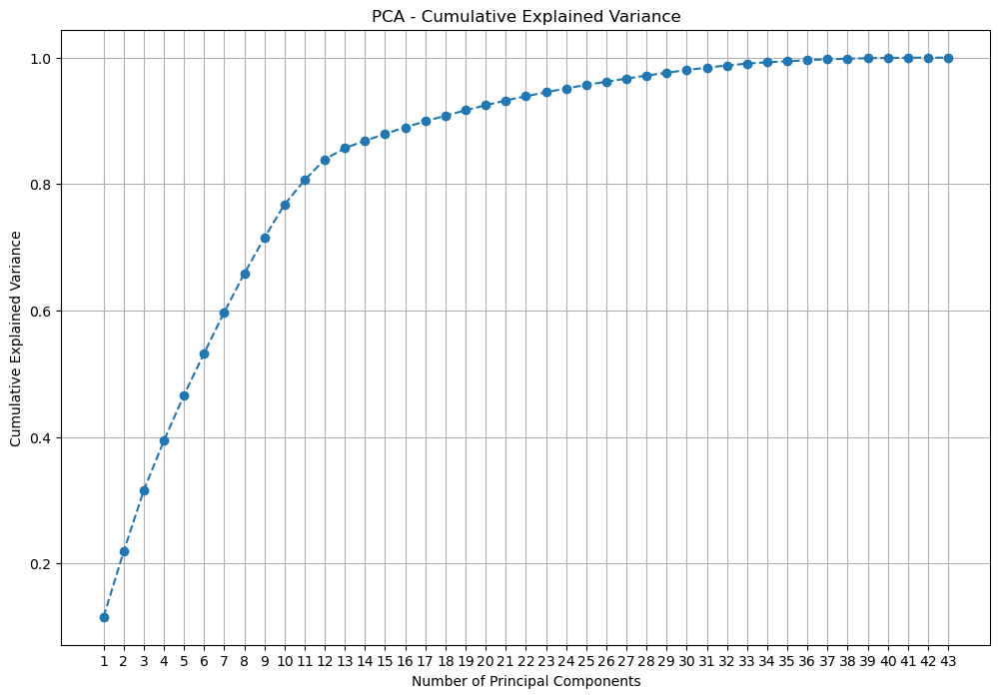

In [76]:
#PCA on full dataset
pca = PCA()
pca_components = pca.fit_transform(final_cluster_data)

#plot explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(12, 8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('PCA - Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.xticks(range(1, len(explained_variance) + 1))
plt.show()

In [77]:
#choose number of components to retain 90% variance
n_components = np.argmax(explained_variance >= 0.90) + 1
print(f"Number of components to retain 90% variance: {n_components}")

Number of components to retain 90% variance: 18


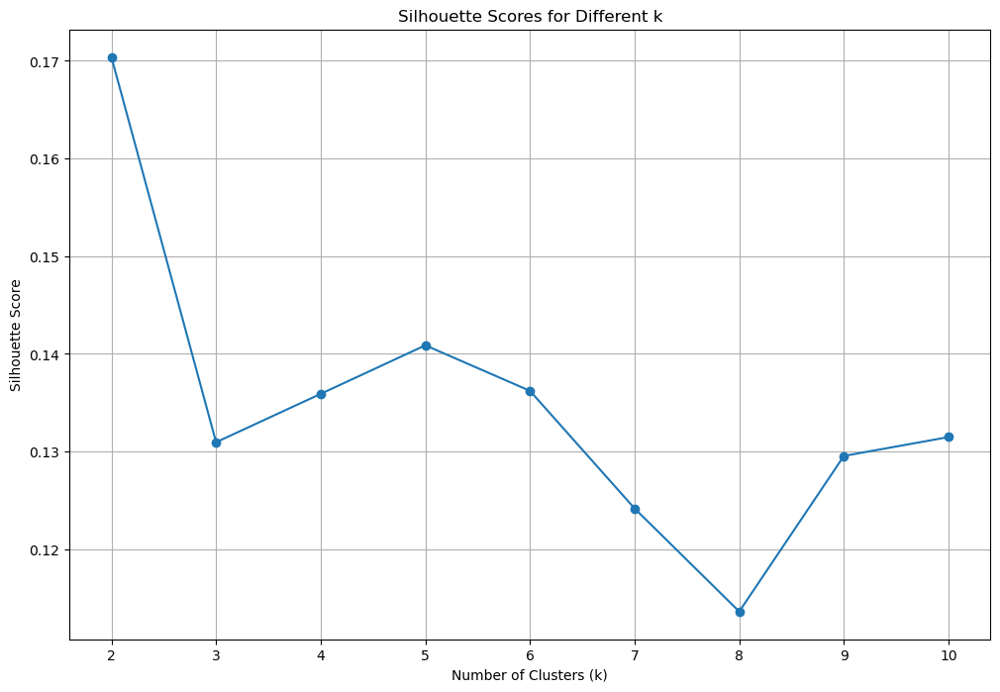

In [78]:
#redo PCA with selected number of components
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(final_cluster_data)

#silhouette scores for different k
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(pca_data)
    score = silhouette_score(pca_data, labels)
    silhouette_scores.append(score)

#plot silhouette scores
plt.figure(figsize=(12, 8))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid()
plt.show()

In [79]:
#choose best k (highest silhouette score)
best_k = k_values[np.argmax(silhouette_scores)]
print(f"Best number of clusters (k): {best_k}")

Best number of clusters (k): 2


##### K-Means Clustering

In [80]:
#choosing 4 clusters based on dendrogram
#k-means clustering with 4 clusters on PCA data
final_kmeans = KMeans(n_clusters = 4, random_state=42, n_init=10)
final_labels = final_kmeans.fit_predict(pca_data)

#add cluster labels to original data
final_cluster_data['kmeans_cluster'] = final_labels

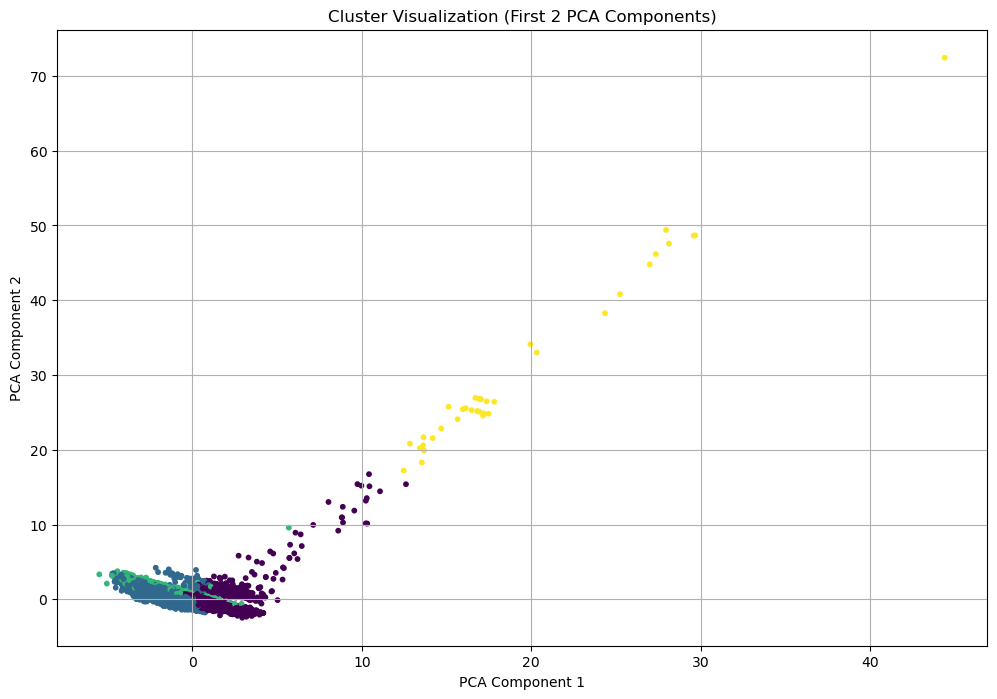

In [81]:
#visualize clusters in 2D
if n_components > 2:
    plt.figure(figsize=(12, 8))
    plt.scatter(pca_data[:, 0], pca_data[:, 1], c=final_labels, cmap='viridis', s=10)
    plt.title('Cluster Visualization (First 2 PCA Components)')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.grid()
    plt.show()

In [82]:
#display first 5 rows of the clustered data
final_cluster_data.head()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,...,booking_month_10,booking_month_11,booking_month_12,booking_dayofweek_1,booking_dayofweek_2,booking_dayofweek_3,booking_dayofweek_4,booking_dayofweek_5,booking_dayofweek_6,kmeans_cluster
0,-1.022620,-1.048547,-0.225928,-1.874655,-0.313679,0,-0.065815,-0.038766,-0.339091,-0.063491,...,False,False,False,False,False,True,False,False,False,0
1,0.172100,-1.048547,1.181149,0.098321,-0.313679,0,-0.065815,-0.038766,-0.339091,-0.063491,...,False,False,False,False,False,False,False,True,False,0
2,-0.163004,-1.048547,1.181149,-1.874655,-0.313679,0,-0.065815,-0.038766,-0.339091,-0.063491,...,False,False,False,False,False,False,False,False,False,0
3,0.230379,1.263497,1.181149,0.098321,-0.313679,0,-0.065815,-0.038766,-0.339091,-0.063491,...,False,False,False,True,False,False,False,False,False,1
4,0.346938,-1.048547,-0.225928,0.098321,-0.313679,0,-0.065815,-0.038766,-0.339091,-0.063491,...,False,False,False,True,False,False,False,False,False,0


In [83]:
#analyze cluster labels: summary of adr by cluster
cluster_summary = final_cluster_data.groupby('kmeans_cluster')['adr'].agg(['mean', 'std', 'count']).reset_index()
cluster_summary['mean'] = cluster_summary['mean'].round(2)
cluster_summary['std'] = cluster_summary['std'].round(2)
cluster_summary['count'] = cluster_summary['count'].astype(int)
cluster_summary

#cluster 2: has a very low count

,kmeans_cluster,mean,std,count
0,0,-0.41,0.74,24582
1,1,0.60,1.02,16676
2,2,0.51,1.04,1409
3,3,-0.94,0.34,35


In [84]:
#list of columns that have 'market_segment' in their name
market_segment_cols = [col for col in final_cluster_data.columns if 'market_segment' in col]

#list of columns that have 'meal' in their name
meal_cols = [col for col in final_cluster_data.columns if 'meal' in col]

#list of columns that have 'reserved_room_type' in their name
reserved_room_type_cols = [col for col in final_cluster_data.columns if 'reserved_room_type' in col]

#list of columns that have 'booking_month' in their name
booking_month_cols = [col for col in final_cluster_data.columns if 'booking_month' in col]

In [85]:
#summary of market segment by cluster
market_segment_summary = final_cluster_data.groupby('kmeans_cluster')[market_segment_cols].agg(['mean']).reset_index()
market_segment_summary.columns = ['_'.join(col).strip() for col in market_segment_summary.columns.values]
market_segment_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
market_segment_summary = market_segment_summary.round(2)
market_segment_summary

,cluster,market_segment_Groups_mean,market_segment_Offline TA/TO_mean,market_segment_Online TA_mean
0,0,0.04,0.19,0.69
1,1,0.01,0.05,0.88
2,2,0.00,0.03,0.77
3,3,0.03,0.23,0.71


In [86]:
#summary of meal by cluster
meal_summary = final_cluster_data.groupby('kmeans_cluster')[meal_cols].agg(['mean']).reset_index()
meal_summary.columns = ['_'.join(col).strip() for col in meal_summary.columns.values]
meal_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
meal_summary = meal_summary.round(2)
meal_summary

,cluster,meal_Half Board_mean,meal_No Meal Package_mean
0,0,0.03,0.27
1,1,0.08,0.09
2,2,0.07,0.14
3,3,0.00,0.23


In [87]:
#summary of reserved room type by cluster
reserved_room_type_summary = final_cluster_data.groupby('kmeans_cluster')[reserved_room_type_cols].agg(['mean']).reset_index()
reserved_room_type_summary.columns = ['_'.join(col).strip() for col in reserved_room_type_summary.columns.values]
reserved_room_type_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
reserved_room_type_summary = reserved_room_type_summary.round(2)
reserved_room_type_summary

,cluster,reserved_room_type_B_mean,reserved_room_type_C_mean,reserved_room_type_D_mean,reserved_room_type_E_mean,reserved_room_type_F_mean,reserved_room_type_G_mean
0,0,0.02,0.0,0.13,0.01,0.00,0.00
1,1,0.02,0.0,0.36,0.05,0.08,0.02
2,2,0.02,0.0,0.23,0.06,0.06,0.01
3,3,0.00,0.0,0.17,0.00,0.00,0.00


In [88]:
#summary of booking month by cluster
booking_month_summary = final_cluster_data.groupby('kmeans_cluster')[booking_month_cols].agg(['mean']).reset_index()
booking_month_summary.columns = ['_'.join(col).strip() for col in booking_month_summary.columns.values]
booking_month_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
booking_month_summary = booking_month_summary.round(2)
booking_month_summary

,cluster,booking_month_2_mean,booking_month_3_mean,booking_month_4_mean,booking_month_5_mean,booking_month_6_mean,booking_month_7_mean,booking_month_8_mean,booking_month_9_mean,booking_month_10_mean,booking_month_11_mean,booking_month_12_mean
0,0,0.13,0.09,0.07,0.07,0.05,0.06,0.08,0.09,0.06,0.06,0.08
1,1,0.14,0.11,0.10,0.08,0.05,0.06,0.06,0.06,0.06,0.06,0.07
2,2,0.13,0.11,0.08,0.07,0.05,0.06,0.10,0.04,0.06,0.05,0.08
3,3,0.20,0.03,0.00,0.03,0.00,0.00,0.00,0.00,0.09,0.00,0.00


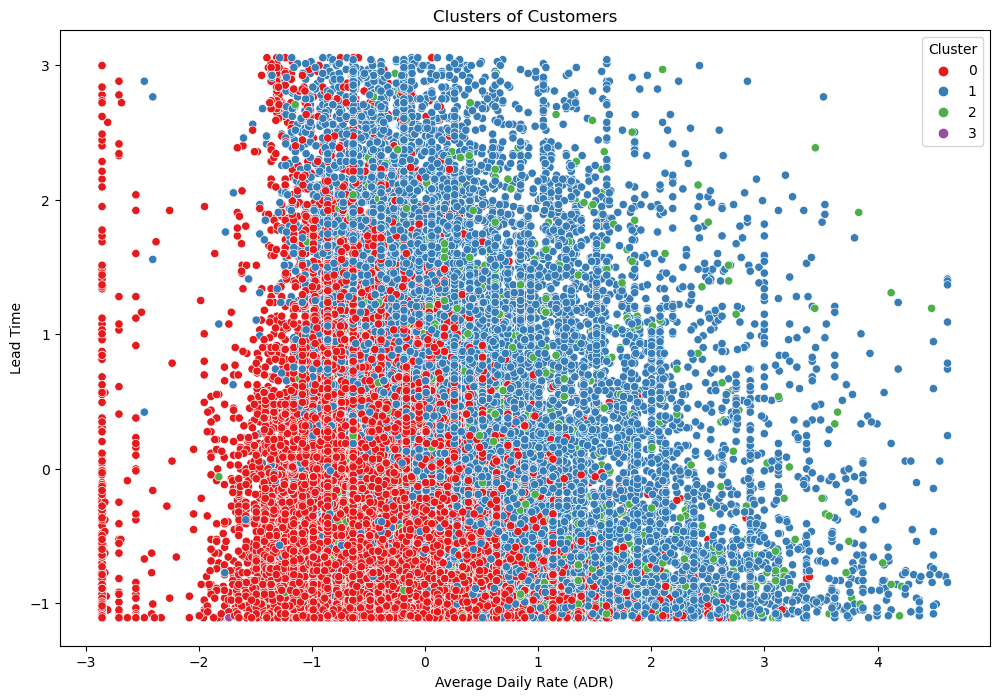

In [89]:
#plot clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(data=final_cluster_data, x='adr', y='lead_time', hue='kmeans_cluster', palette='Set1')
plt.title('Clusters of Customers')
plt.xlabel('Average Daily Rate (ADR)')
plt.ylabel('Lead Time')
plt.legend(title='Cluster')
plt.show()

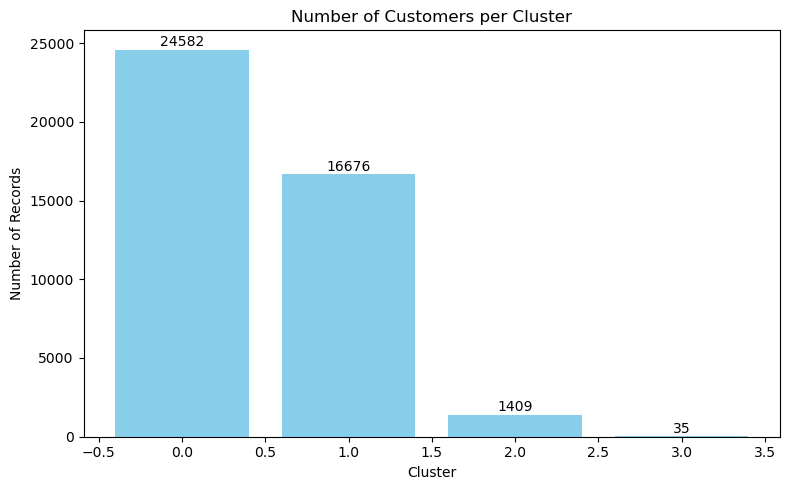

In [90]:
#LC insight visual: Just to show the count of records in each cluster for all data
#count records per cluster
cluster_sizes = final_cluster_data['kmeans_cluster'].value_counts().sort_index()

#plot
plt.figure(figsize=(8, 5))
bars = plt.bar(cluster_sizes.index, cluster_sizes.values, color='skyblue')
plt.title("Number of Customers per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Number of Records")

#add labels
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 20, int(yval), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [91]:
#LC insight visual: These three cells show the top features in each cluster
#calculate mean for all numeric features by cluster
cluster_means = final_cluster_data.groupby('kmeans_cluster').mean()

top_features_per_cluster = {}

for cluster in cluster_means.index:
    #get absolute difference between this cluster and others
    diff = cluster_means.loc[cluster] - cluster_means.drop(cluster).mean()
    
    #select top N features that stand out the most for this cluster
    top_features = diff.abs().sort_values(ascending=False).head(5).index.tolist()
    top_features_per_cluster[cluster] = top_features


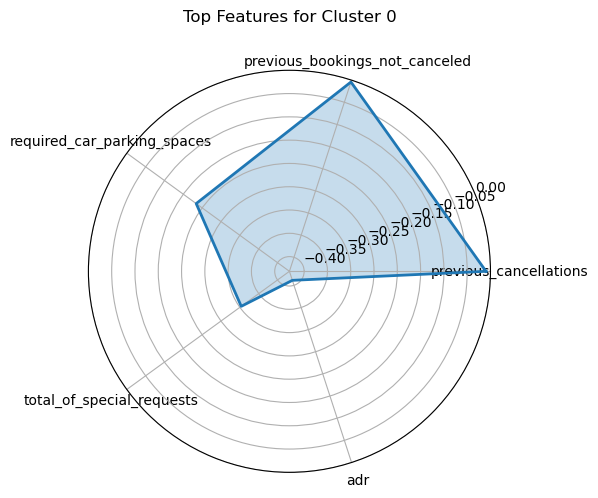

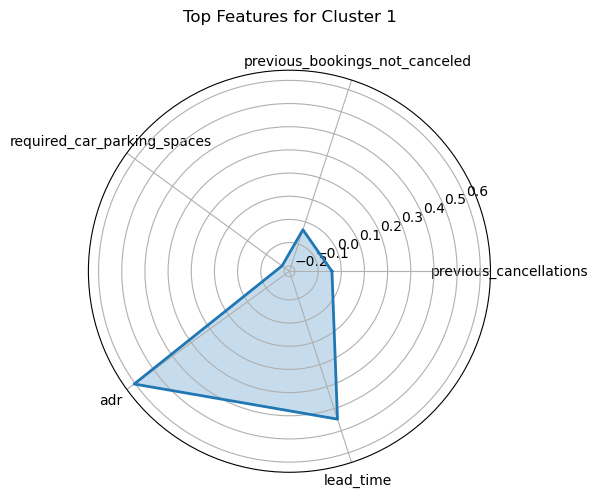

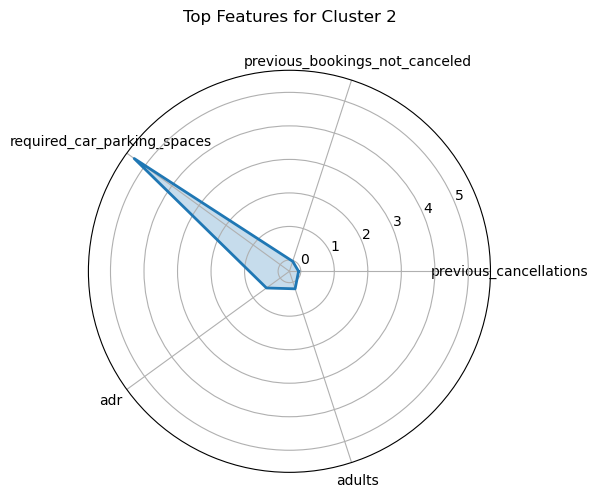

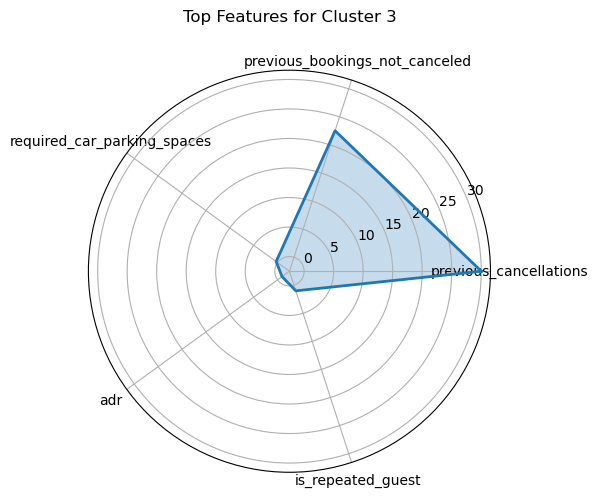

In [92]:
#add cluster labels to PCA DataFrame
for cluster, features in top_features_per_cluster.items():
    #get data
    values = cluster_means.loc[cluster, features].tolist()
    values += values[:1]  # Close the circle

    #setup angles
    angles = [n / float(len(features)) * 2 * pi for n in range(len(features))]
    angles += angles[:1]

    #plot
    plt.figure(figsize=(6, 6))
    ax = plt.subplot(111, polar=True)
    ax.plot(angles, values, linewidth=2)
    ax.fill(angles, values, alpha=0.25)

    #labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features, fontsize=10)
    plt.title(f'Top Features for Cluster {cluster}', y=1.1)
    plt.tight_layout()
    plt.show()


#### Version 2: Cluster Analysis on Fulfilled Bookings

##### Hierarchical Clustering

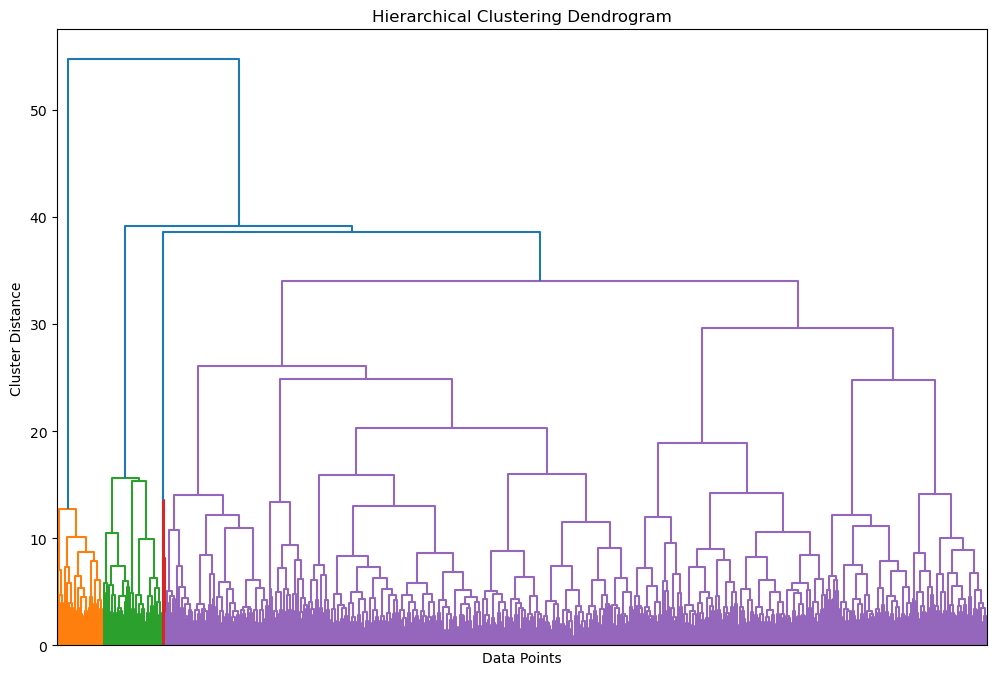

In [93]:
#load cluster data
cluster_data = pd.read_csv('hotel_bookings_cluster.csv')

#filter on fulfilled bookings
cluster_data = cluster_data[cluster_data['is_canceled'] == 0]
book_confirm = cluster_data.drop(['is_canceled'], axis=1)

#sample data for dendrogram
confirm_sample = book_confirm.sample(n=1000, random_state = 42)

#hierarchical clustering
Z = linkage(confirm_sample, method='ward', metric='euclidean')

#plot dendrogram
plt.figure(figsize=(12, 8))
dendrogram(Z, leaf_rotation=90, leaf_font_size=10)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Cluster Distance')
plt.xticks(visible = False)
plt.show()

In [94]:
#set number of clusters you want
n_clusters = 3

#cut the dendrogram to get cluster labels
cluster_labels = fcluster(Z, n_clusters, criterion='maxclust')

#add to your original sample dataframe
confirm_sample['hierarchical_cluster'] = cluster_labels

#count how many samples are in each cluster
cluster_counts = confirm_sample['hierarchical_cluster'].value_counts().sort_index()

#print the results
print(cluster_counts)

hierarchical_cluster
1     50
2     63
3    887
Name: count, dtype: int64


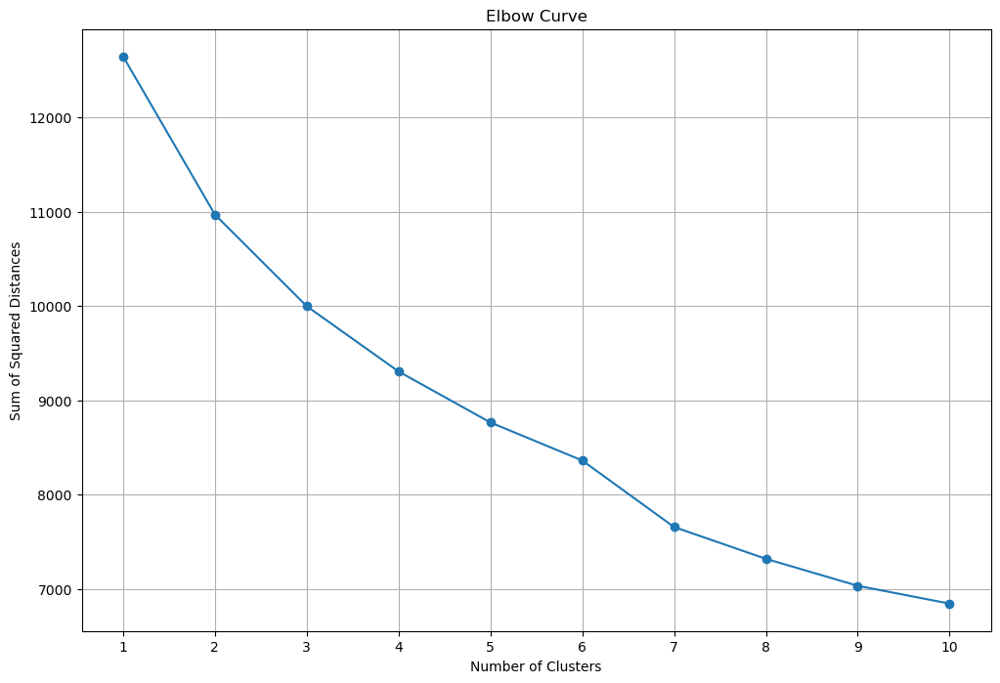

In [95]:
#plot elbow curve
plt.figure(figsize=(12, 8))
plt.title('Elbow Curve')
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(confirm_sample)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 11), sse, marker='o')
plt.xticks(range(1, 11))
plt.grid()
plt.show()

##### Principle Component Analysis

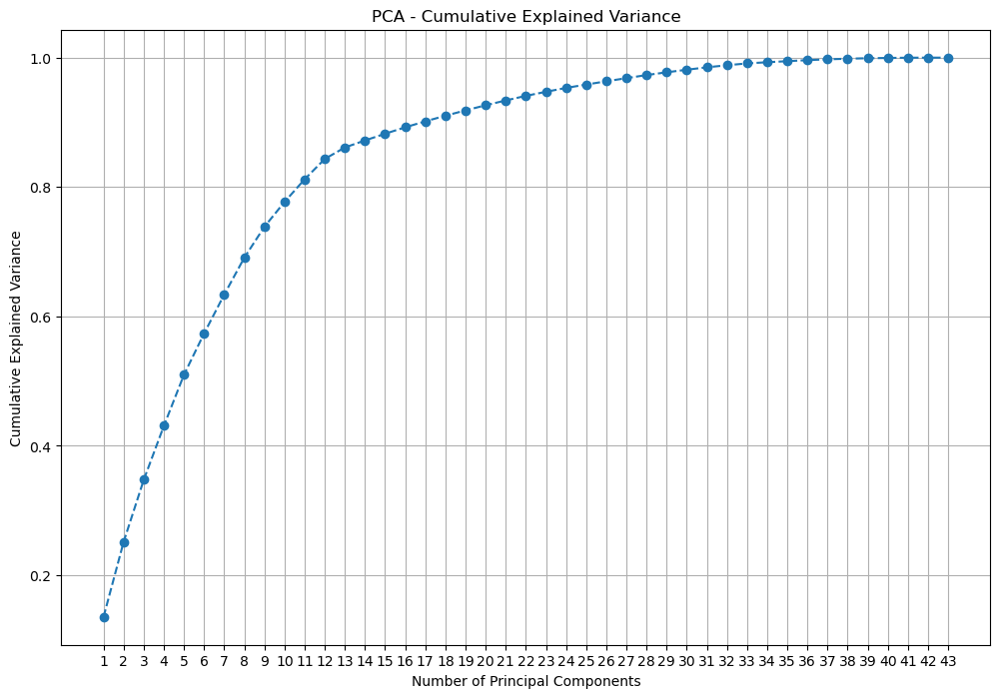

In [96]:
#PCA on full dataset
pca = PCA()
pca_components = pca.fit_transform(book_confirm)

#plot explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(12, 8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('PCA - Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.xticks(range(1, len(explained_variance) + 1))
plt.show()

In [97]:
#choose number of components to retain 90% variance
n_components = np.argmax(explained_variance >= 0.90) + 1
print(f"Number of components to retain 90% variance: {n_components}")

Number of components to retain 90% variance: 17


In [ ]:
#redo PCA with selected number of components
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(book_confirm)

#silhouette scores for different k
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(pca_data)
    score = silhouette_score(pca_data, labels)
    silhouette_scores.append(score)

#plot silhouette scores
plt.figure(figsize=(12, 8))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid()
plt.show()

In [ ]:
#choose best k (highest silhouette score)
best_k = k_values[np.argmax(silhouette_scores)]
print(f"Best number of clusters (k): {best_k}")

##### K-Means Clustering

In [ ]:
#choosing 4 clusters based on dendrogram
#k-means clustering with 4 clusters on PCA data
final_kmeans = KMeans(n_clusters = 4, random_state=42, n_init=10)
final_labels = final_kmeans.fit_predict(pca_data)

#add cluster labels to original data
book_confirm['kmeans_cluster'] = final_labels

In [ ]:
#visualize clusters in 2D
if n_components > 2:
    plt.figure(figsize=(12, 8))
    plt.scatter(pca_data[:, 0], pca_data[:, 1], c=final_labels, cmap='viridis', s=10)
    plt.title('Cluster Visualization (First 2 PCA Components)')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.grid()
    plt.show()

In [ ]:
#display first 5 rows of the clustered data
book_confirm.head()

In [ ]:
#analyze cluster labels: summary of adr by cluster
cluster_summary = book_confirm.groupby('kmeans_cluster')['adr'].agg(['mean', 'std', 'count']).reset_index()
cluster_summary['mean'] = cluster_summary['mean'].round(2)
cluster_summary['std'] = cluster_summary['std'].round(2)
cluster_summary['count'] = cluster_summary['count'].astype(int)
cluster_summary

#cluster 2: has a very low count

In [ ]:
#list of columns that have 'market_segment' in their name
market_segment_cols = [col for col in book_confirm.columns if 'market_segment' in col]

#list of columns that have 'meal' in their name
meal_cols = [col for col in book_confirm.columns if 'meal' in col]

#list of columns that have 'reserved_room_type' in their name
reserved_room_type_cols = [col for col in book_confirm.columns if 'reserved_room_type' in col]

#list of columns that have 'booking_month' in their name
booking_month_cols = [col for col in book_confirm.columns if 'booking_month' in col]

In [ ]:
#summary of market segment by cluster
market_segment_summary = book_confirm.groupby('kmeans_cluster')[market_segment_cols].agg(['mean']).reset_index()
market_segment_summary.columns = ['_'.join(col).strip() for col in market_segment_summary.columns.values]
market_segment_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
market_segment_summary = market_segment_summary.round(2)
market_segment_summary

In [ ]:
#summary of meal by cluster
meal_summary = book_confirm.groupby('kmeans_cluster')[meal_cols].agg(['mean']).reset_index()
meal_summary.columns = ['_'.join(col).strip() for col in meal_summary.columns.values]
meal_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
meal_summary = meal_summary.round(2)
meal_summary

In [ ]:
#summary of reserved room type by cluster
reserved_room_type_summary = book_confirm.groupby('kmeans_cluster')[reserved_room_type_cols].agg(['mean']).reset_index()
reserved_room_type_summary.columns = ['_'.join(col).strip() for col in reserved_room_type_summary.columns.values]
reserved_room_type_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
reserved_room_type_summary = reserved_room_type_summary.round(2)
reserved_room_type_summary

In [ ]:
#summary of booking month by cluster
booking_month_summary = book_confirm.groupby('kmeans_cluster')[booking_month_cols].agg(['mean']).reset_index()
booking_month_summary.columns = ['_'.join(col).strip() for col in booking_month_summary.columns.values]
booking_month_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
booking_month_summary = booking_month_summary.round(2)
booking_month_summary

In [ ]:
#plot clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(data=book_confirm, x='adr', y='lead_time', hue='kmeans_cluster', palette='Set1')
plt.title('Clusters of Customers')
plt.xlabel('Average Daily Rate (ADR)')
plt.ylabel('Lead Time')
plt.legend(title='Cluster')
plt.show()

In [ ]:
#LC insight visual: Just to show the count of records in each cluster for all data
#count records per cluster
cluster_sizes = book_confirm['kmeans_cluster'].value_counts().sort_index()

#plot
plt.figure(figsize=(8, 5))
bars = plt.bar(cluster_sizes.index, cluster_sizes.values, color='skyblue')
plt.title("Number of Customers per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Number of Records")

#add labels
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 20, int(yval), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
#LC insight visual: These three cells show the top features in each cluster
#calculate mean for all numeric features by cluster
cluster_means = book_confirm.groupby('kmeans_cluster').mean()

top_features_per_cluster = {}

for cluster in cluster_means.index:
    #get absolute difference between this cluster and others
    diff = cluster_means.loc[cluster] - cluster_means.drop(cluster).mean()
    
    #select top N features that stand out the most for this cluster
    top_features = diff.abs().sort_values(ascending=False).head(5).index.tolist()
    top_features_per_cluster[cluster] = top_features

In [ ]:
#add cluster labels to PCA DataFrame
for cluster, features in top_features_per_cluster.items():
    #get data
    values = cluster_means.loc[cluster, features].tolist()
    values += values[:1]  # Close the circle

    #setup angles
    angles = [n / float(len(features)) * 2 * pi for n in range(len(features))]
    angles += angles[:1]

    #plot
    plt.figure(figsize=(6, 6))
    ax = plt.subplot(111, polar=True)
    ax.plot(angles, values, linewidth=2)
    ax.fill(angles, values, alpha=0.25)

    #labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features, fontsize=10)
    plt.title(f'Top Features for Cluster {cluster}', y=1.1)
    plt.tight_layout()
    plt.show()

#### Version 3: Cluster Analysis on Cancellations

##### Hierarchical Clustering

In [ ]:
#load cluster data
cluster_data = pd.read_csv('hotel_bookings_cluster.csv')

#filter on fulfilled bookings
cluster_data = cluster_data[cluster_data['is_canceled'] == 1]
book_cancel = cluster_data.drop(['is_canceled'], axis=1)

#sample data for dendrogram
cancel_sample = book_cancel.sample(n=1000, random_state = 42)

#hierarchical clustering
Z = linkage(cancel_sample, method='ward', metric='euclidean')

#plot dendrogram
plt.figure(figsize=(12, 8))
dendrogram(Z, leaf_rotation=90, leaf_font_size=10)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Cluster Distance')
plt.xticks(visible = False)
plt.show()

In [ ]:
#set number of clusters you want
n_clusters = 4

#cut the dendrogram to get cluster labels
cluster_labels = fcluster(Z, n_clusters, criterion='maxclust')

#add to your original sample dataframe
cancel_sample['hierarchical_cluster'] = cluster_labels

#count how many samples are in each cluster
cluster_counts = cancel_sample['hierarchical_cluster'].value_counts().sort_index()

#print the results
print(cluster_counts)

In [ ]:
cancel_sample.to_csv("cancel_sample.csv", index=False)

In [ ]:
#plot elbow curve
plt.figure(figsize=(12, 8))
plt.title('Elbow Curve')
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Distances')
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(cancel_sample)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 11), sse, marker='o')
plt.xticks(range(1, 11))
plt.grid()
plt.show()

##### Principle Component Analysis

In [ ]:
#PCA on full dataset
pca = PCA()
pca_components = pca.fit_transform(book_cancel)

#plot explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(12, 8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('PCA - Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.xticks(range(1, len(explained_variance) + 1))
plt.show()

In [ ]:
#choose number of components to retain 90% variance
n_components = np.argmax(explained_variance >= 0.90) + 1
print(f"Number of components to retain 90% variance: {n_components}")

In [ ]:
#redo PCA with selected number of components
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(book_cancel)

#silhouette scores for different k
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(pca_data)
    score = silhouette_score(pca_data, labels)
    silhouette_scores.append(score)

#plot silhouette scores
plt.figure(figsize=(12, 8))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Scores for Different k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid()
plt.show()

In [ ]:
#choose best k (highest silhouette score)
best_k = k_values[np.argmax(silhouette_scores)]
print(f"Best number of clusters (k): {best_k}")

##### K-Means Clustering

In [ ]:
#choosing 4 clusters based on dendrogram
#k-means clustering with 4 clusters on PCA data
final_kmeans = KMeans(n_clusters = 4, random_state=42, n_init=10)
final_labels = final_kmeans.fit_predict(pca_data)

#add cluster labels to original data
book_cancel['kmeans_cluster'] = final_labels

In [ ]:
#visualize clusters in 2D
if n_components > 2:
    plt.figure(figsize=(12, 8))
    plt.scatter(pca_data[:, 0], pca_data[:, 1], c=final_labels, cmap='viridis', s=10)
    plt.title('Cluster Visualization (First 2 PCA Components)')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.grid()
    plt.show()

In [ ]:
#display first 5 rows of the clustered data
book_cancel.head()

In [ ]:
book_cancel.columns

In [ ]:
#analyze cluster labels: summary of adr by cluster
cluster_summary = book_cancel.groupby('kmeans_cluster')['adr'].agg(['mean', 'std', 'count']).reset_index()
cluster_summary['mean'] = cluster_summary['mean'].round(2)
cluster_summary['std'] = cluster_summary['std'].round(2)
cluster_summary['count'] = cluster_summary['count'].astype(int)
cluster_summary

#cluster 2: has a very low count

In [ ]:
#list of columns that have 'market_segment' in their name
market_segment_cols = [col for col in book_cancel.columns if 'market_segment' in col]

#list of columns that have 'meal' in their name
meal_cols = [col for col in book_cancel.columns if 'meal' in col]

#list of columns that have 'reserved_room_type' in their name
reserved_room_type_cols = [col for col in book_cancel.columns if 'reserved_room_type' in col]

#list of columns that have 'booking_month' in their name
booking_month_cols = [col for col in book_cancel.columns if 'booking_month' in col]

In [ ]:
#summary of market segment by cluster
market_segment_summary = book_cancel.groupby('kmeans_cluster')[market_segment_cols].agg(['mean']).reset_index()
market_segment_summary.columns = ['_'.join(col).strip() for col in market_segment_summary.columns.values]
market_segment_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
market_segment_summary = market_segment_summary.round(2)
market_segment_summary

In [ ]:
#summary of meal by cluster
meal_summary = book_cancel.groupby('kmeans_cluster')[meal_cols].agg(['mean']).reset_index()
meal_summary.columns = ['_'.join(col).strip() for col in meal_summary.columns.values]
meal_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
meal_summary = meal_summary.round(2)
meal_summary

In [ ]:
#summary of reserved room type by cluster
reserved_room_type_summary = book_cancel.groupby('kmeans_cluster')[reserved_room_type_cols].agg(['mean']).reset_index()
reserved_room_type_summary.columns = ['_'.join(col).strip() for col in reserved_room_type_summary.columns.values]
reserved_room_type_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
reserved_room_type_summary = reserved_room_type_summary.round(2)
reserved_room_type_summary

In [ ]:
#summary of booking month by cluster
booking_month_summary = book_cancel.groupby('kmeans_cluster')[booking_month_cols].agg(['mean']).reset_index()
booking_month_summary.columns = ['_'.join(col).strip() for col in booking_month_summary.columns.values]
booking_month_summary.rename(columns={'kmeans_cluster_': 'cluster'}, inplace=True)
booking_month_summary = booking_month_summary.round(2)
booking_month_summary

In [ ]:
#plot clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(data=book_cancel, x='adr', y='lead_time', hue='kmeans_cluster', palette='Set1')
plt.title('Clusters of Customers')
plt.xlabel('Average Daily Rate (ADR)')
plt.ylabel('Lead Time')
plt.legend(title='Cluster')
plt.show()

In [ ]:
# Load the dataset
#df = pd.read_csv("cancel_sample.csv")

# List of features to average
columns_to_average = [
   'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests', 'meal_Half Board', 'meal_No Meal Package',
       'market_segment_Groups', 'market_segment_Offline TA/TO',
       'market_segment_Online TA', 'distribution_channel_TA/TO',
       'reserved_room_type_B', 'reserved_room_type_C', 'reserved_room_type_D',
       'reserved_room_type_E', 'reserved_room_type_F', 'reserved_room_type_G',
       'customer_type_Transient', 'booking_month_2', 'booking_month_3',
       'booking_month_4', 'booking_month_5', 'booking_month_6',
       'booking_month_7', 'booking_month_8', 'booking_month_9',
       'booking_month_10', 'booking_month_11', 'booking_month_12',
       'booking_dayofweek_1', 'booking_dayofweek_2', 'booking_dayofweek_3',
       'booking_dayofweek_4', 'booking_dayofweek_5', 'booking_dayofweek_6'
]

# Group by hierarchical cluster and calculate means
grouped_means = book_cancel.groupby('kmeans_cluster')[columns_to_average].mean().round(2)

# Display the result
print(grouped_means)


In [ ]:
# Optional: expand display so all rows/columns are visible
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)  # or set a specific value like 1000
pd.set_option('display.colheader_justify', 'left')

# Now print the full DataFrame
print(grouped_means)


In [ ]:
#LC insight visual: Just to show the count of records in each cluster for all data
#count records per cluster
cluster_sizes = book_cancel['kmeans_cluster'].value_counts().sort_index()

#plot
plt.figure(figsize=(8, 5))
bars = plt.bar(cluster_sizes.index, cluster_sizes.values, color='skyblue')
plt.title("Number of Customers per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Number of Records")

#add labels
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 20, int(yval), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
#LC insight visual: These three cells show the top features in each cluster
#calculate mean for all numeric features by cluster
cluster_means = book_cancel.groupby('kmeans_cluster').mean()

top_features_per_cluster = {}

for cluster in cluster_means.index:
    #get absolute difference between this cluster and others
    diff = cluster_means.loc[cluster] - cluster_means.drop(cluster).mean()
    
    #select top N features that stand out the most for this cluster
    top_features = diff.abs().sort_values(ascending=False).head(5).index.tolist()
    top_features_per_cluster[cluster] = top_features

In [ ]:
#add cluster labels to PCA DataFrame
for cluster, features in top_features_per_cluster.items():
    #get data
    values = cluster_means.loc[cluster, features].tolist()
    values += values[:1]  # Close the circle

    #setup angles
    angles = [n / float(len(features)) * 2 * pi for n in range(len(features))]
    angles += angles[:1]

    #plot
    plt.figure(figsize=(6, 6))
    ax = plt.subplot(111, polar=True)
    ax.plot(angles, values, linewidth=2)
    ax.fill(angles, values, alpha=0.25)

    #labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features, fontsize=10)
    plt.title(f'Top Features for Cluster {cluster}', y=1.1)
    plt.tight_layout()
    plt.show()

In [ ]:
#LC insight visual: heatmap shows average booking month per cluster (to see when each cluster is booking the most)
#group by cluster and get average cancellation rate per month
monthly_cluster_avg = book_cancel.groupby('kmeans_cluster')[booking_month_cols].mean()

plt.figure(figsize=(12, 6))
sns.heatmap(monthly_cluster_avg, cmap="Blues", annot=True, fmt=".2f")
plt.title("Average Booking Month Distribution by Cancellation Cluster")
plt.xlabel("Booking Month")
plt.ylabel("Cluster")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()